In [6]:
!pip install obspy
import obspy
from obspy import read
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, correlate, hilbert, welch
from scipy.interpolate import CubicSpline
from scipy.interpolate import interp1d
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from scipy.interpolate import griddata
from scipy.fft import fft, fftfreq
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Fully Developed Class System, copied from the "Intial Processing and Acoustic Impedance" notebook and further developed for all required definitions

In [8]:
class seismicgather:
    def __init__(self):
        self.data = []
        self.rx = None
        self.rz = None
        self.delta_t = None
        self.clustering_results = None  # Store clustering results

    def read_segy_data(self, segy_path):
        stream = read(segy_path, format="SEGY")
        self.delta_depth = 0.2757  # Depth interval in meters, as observed

        # Set up the range for distance from shoreline: 0 to 100 km across all traces
        distance_range = np.linspace(100, 0, len(stream))  # Reverse distance range

        for i, trace in enumerate(stream):
            geodata_instance = geodata()
            geodata_instance.data = trace.data
            geodata_instance.rx = distance_range[i]  # Map distance from shoreline for each trace (reversed)
            geodata_instance.depth_axis = np.arange(len(trace.data)) * self.delta_depth  # Depth in meters
            self.data.append(geodata_instance)

    def read_npy_data(self, npy_path, distance_range, depth_interval=0.2757):
        """
        Read depth-converted seismic data from a .npy file and flip horizontally.

        Parameters:
        - npy_path: Path to the .npy file
        - distance_range: Range of distances corresponding to traces (tuple: start, end)
        - depth_interval: Interval between depth samples in meters (determined from data)
        """
        seismic_data = np.load(npy_path)
        seismic_data = np.flip(seismic_data, axis=0)  # Flip horizontally
        num_traces, num_depths = seismic_data.shape
        self.delta_depth = depth_interval
        distances = np.linspace(distance_range[0], distance_range[1], num_traces)

        for i, trace_amplitudes in enumerate(seismic_data):
            geodata_instance = geodata()
            geodata_instance.data = trace_amplitudes
            geodata_instance.rx = distances[i]
            geodata_instance.depth_axis = np.arange(num_depths) * self.delta_depth
            self.data.append(geodata_instance)

    def wiggle_plot_depth_distance(self, scale=20, trace_step=500):
        fig, ax = plt.subplots(figsize=(14, 6))

        for i, trace in enumerate(self.data[::trace_step]):
            data_norm = trace.data / np.max(np.abs(trace.data)) if np.max(np.abs(trace.data)) != 0 else trace.data
            distance_value = trace.rx  # Distance from shoreline
            ax.plot(data_norm * scale + distance_value, trace.depth_axis, 'k')

        ax.set_xlim(0, 100)
        ax.set_ylim(0, 1000)
        ax.set_xlabel('Distance from Shoreline (km)')
        ax.set_ylabel('Depth (m)')
        ax.invert_yaxis()
        plt.title("Wiggle Plot of Seismic Data (0 to 100 km)")
        plt.show()

    def isolate_section(self, distance_min, distance_max, depth_min, depth_max):
        # Filter the traces based on the distance and depth range
        selected_data = []
        for trace in self.data:
            if distance_min <= trace.rx <= distance_max:
                depth_indices = (trace.depth_axis >= depth_min) & (trace.depth_axis <= depth_max)
                selected_data.append((trace.rx, trace.depth_axis[depth_indices], trace.data[depth_indices]))

        return selected_data

    def wiggle_plot_constrained(self, distance_min, distance_max, depth_min, depth_max, scale=0.1, trace_step=5, offset=0.1):
        """
        Plot wiggle plots constrained by depth and distance ranges with better clarity.

        Parameters:
        - distance_min, distance_max: Range of distances for the wiggle plot
        - depth_min, depth_max: Range of depths for the wiggle plot
        - scale: Scale factor for the wiggle plot
        - trace_step: Step size for selecting traces to plot
        - offset: Horizontal offset between traces to avoid complete overlap
        """
        fig, ax = plt.subplots(figsize=(14, 6))

        for i, trace in enumerate(self.data):
            if distance_min <= trace.rx <= distance_max and i % trace_step == 0:
                data_norm = trace.data / np.max(np.abs(trace.data)) if np.max(np.abs(trace.data)) != 0 else trace.data
                distance_value = trace.rx + offset * i  # Add offset to avoid overlap
                depth_indices = (trace.depth_axis >= depth_min) & (trace.depth_axis <= depth_max)
                ax.plot(data_norm[depth_indices] * scale + distance_value, trace.depth_axis[depth_indices], 'k')

        ax.set_xlim(distance_min, distance_max)
        ax.set_ylim(depth_min, depth_max)
        ax.set_xlabel('Distance from Shoreline (km)')
        ax.set_ylabel('Depth (m)')
        ax.invert_yaxis()
        plt.title(f"Wiggle Plot: {distance_min}-{distance_max} km, {depth_min}-{depth_max} m")
        plt.show()

    def calculate_amplitude_envelope(self, distance_min, distance_max, depth_min, depth_max, trace_step=1, offset=0.1):
        """
        Calculate amplitude envelopes for traces within a specific distance and depth range, considering the offset.

        Parameters:
        - distance_min, distance_max: Range of distances for the envelope calculation
        - depth_min, depth_max: Range of depths for the envelope calculation
        - trace_step: Step size for selecting traces
        - offset: Horizontal offset between traces
        """
        envelopes = []
        depths = []
        distances = []

        for i, trace in enumerate(self.data):
            if distance_min <= trace.rx <= distance_max and i % trace_step == 0:
                # Constrain depth range
                depth_mask = (trace.depth_axis >= depth_min) & (trace.depth_axis <= depth_max)
                constrained_depth = trace.depth_axis[depth_mask]

                # Calculate the envelope for the constrained data
                analytic_signal = hilbert(trace.data)
                constrained_envelope = np.abs(analytic_signal)[depth_mask]

                # Include the offset for visualization
                distance_value = trace.rx + i * offset

                envelopes.append(constrained_envelope)
                depths.append(constrained_depth)
                distances.append(distance_value)

        return np.array(distances), np.array(depths), np.array(envelopes)

    def wiggle_plot_with_envelope(self, distance_min, distance_max, depth_min, depth_max, scale=0.1, trace_step=1, offset=0.1):
        """
        Create a wiggle plot with amplitude envelope overlay and offset for a constrained window.

        Parameters:
        - distance_min, distance_max: Range of distances for the wiggle plot
        - depth_min, depth_max: Range of depths for the wiggle plot
        - scale: Scale factor for the wiggle plot
        - trace_step: Step size for selecting traces to plot
        - offset: Horizontal offset between traces to avoid overlap
        """
        fig, ax = plt.subplots(figsize=(12, 6))

        # Plot the wiggle traces
        for i, trace in enumerate(self.data):
            if distance_min <= trace.rx <= distance_max and i % trace_step == 0:
                # Constrain depth range
                depth_mask = (trace.depth_axis >= depth_min) & (trace.depth_axis <= depth_max)
                constrained_depth = trace.depth_axis[depth_mask]
                constrained_data = trace.data[depth_mask]

                # Normalize for wiggle scaling
                data_norm = constrained_data / np.max(np.abs(constrained_data)) if np.max(np.abs(constrained_data)) != 0 else constrained_data

                # Apply offset to avoid overlapping
                distance_value = trace.rx + i * offset
                ax.plot(data_norm * scale + distance_value, constrained_depth, 'k')

        # Calculate and overlay amplitude envelopes
        distances, depths, envelopes = self.calculate_amplitude_envelope(distance_min, distance_max, depth_min, depth_max, trace_step, offset)
        for i, (distance, depth, envelope) in enumerate(zip(distances, depths, envelopes)):
            ax.plot(envelope * scale + distance, depth, color='red', alpha=0.6, label="Amplitude Envelope" if i == 0 else "")

        # Plot formatting
        ax.set_xlim(distance_min, distance_max + offset * len(self.data))
        ax.set_ylim(depth_min, depth_max)
        ax.invert_yaxis()
        ax.set_xlabel("Distance from Shoreline (km)")
        ax.set_ylabel("Depth (m)")
        ax.set_title(f"Wiggle Plot with Envelope and Offset: {distance_min}-{distance_max} km, {depth_min}-{depth_max} m")
        plt.legend()
        plt.show()

    def plot_only_envelopes(self, distance_min, distance_max, depth_min, depth_max, trace_step=1, offset=0.2, scale=1.0):
        """
       Plot only the amplitude envelopes for a specific distance and depth range.

        Parameters:
        - distance_min, distance_max: Range of distances to plot.
        - depth_min, depth_max: Range of depths to plot.
        - trace_step: Step size for selecting traces.
        - offset: Horizontal offset between traces to avoid overlap.
        """
        fig, ax = plt.subplots(figsize=(12, 6))

        for i, trace in enumerate(self.data):
            if distance_min <= trace.rx <= distance_max and i % trace_step == 0:
                # Calculate the envelope
                analytic_signal = hilbert(trace.data)
                envelope = np.abs(analytic_signal)

                # Constrain to the specified depth range
                depth_mask = (trace.depth_axis >= depth_min) & (trace.depth_axis <= depth_max)
                constrained_depth = trace.depth_axis[depth_mask]
                constrained_envelope = envelope[depth_mask]

                # Apply offset for clarity
                distance_value = trace.rx + i * offset
                ax.plot(constrained_envelope * scale + distance_value, constrained_depth, color='red', alpha=0.6)

        # Plot formatting
        ax.set_xlim(distance_min, distance_max + offset * len(self.data))
        ax.set_ylim(depth_min, depth_max)
        ax.invert_yaxis()
        ax.set_xlabel("Distance from Shoreline (km)")
        ax.set_ylabel("Depth (m)")
        ax.set_title(f"Amplitude Envelopes: {distance_min}-{distance_max} km, {depth_min}-{depth_max} m")
        plt.show()

    def calculate_envelope_statistics(self, distance_min, distance_max, depth_min, depth_max, trace_step=1, offset=0.1, scale=1.0):
        """
        Calculate amplitude envelope statistics for traces within a specified range.
        Returns mean, standard deviation, and max envelopes for each trace.
        """
        stats = []
        for i, trace in enumerate(self.data):
            if distance_min <= trace.rx <= distance_max and i % trace_step == 0:
                # Constrain depth range
                depth_mask = (trace.depth_axis >= depth_min) & (trace.depth_axis <= depth_max)
                if np.any(depth_mask):
                    # Calculate envelope for constrained range
                    analytic_signal = hilbert(trace.data)
                    constrained_envelope = np.abs(analytic_signal)[depth_mask] * scale

                    # Compute statistics
                    avg_envelope = np.mean(constrained_envelope)
                    std_envelope = np.std(constrained_envelope)
                    max_envelope = np.max(constrained_envelope)

                    # Include offset in distance
                    distance_value = trace.rx + i * offset

                    stats.append((distance_value, avg_envelope, std_envelope, max_envelope))
        return np.array(stats)

    def cluster_envelopes(self, distance_min, distance_max, depth_min, depth_max, trace_step=1, offset=0.1, scale=1.0, num_clusters=3):
        """
        Apply K-Means clustering to amplitude envelopes in the specified range.
        """
        stats = self.calculate_envelope_statistics(distance_min, distance_max, depth_min, depth_max, trace_step, offset, scale)
        distances = stats[:, 0]
        avg_envelopes = stats[:, 1].reshape(-1, 1)  # Reshape for K-Means

        # Apply K-Means clustering
        kmeans = KMeans(n_clusters=num_clusters, random_state=0)
        labels = kmeans.fit_predict(avg_envelopes)

        # Visualize clusters
        plt.figure(figsize=(12, 6))
        plt.scatter(distances, avg_envelopes.flatten(), c=labels, cmap="viridis")
        plt.colorbar(label="Cluster")
        plt.xlabel("Distance from Shoreline (km)")
        plt.ylabel("Average Amplitude Envelope")
        plt.title("K-Means Clustering of Amplitude Envelopes")
        plt.show()

        return labels

    def calculate_envelopes_and_clusters(self, distance_min, distance_max, depth_min, depth_max, trace_step=1, offset=0.1, scale=1.0, n_clusters=3):
        """
        Calculate amplitude envelopes and perform KMeans clustering.

        Parameters:
        - distance_min, distance_max: Constrained distance range.
        - depth_min, depth_max: Constrained depth range.
        - trace_step: Step size for selecting traces.
        - offset: Horizontal offset for traces.
        - scale: Scale factor for envelopes.
        - n_clusters: Number of clusters for KMeans.

        Returns:
        - depths: List of depth arrays for each trace.
        - distances: List of distances corresponding to traces.
        - envelopes: List of envelope arrays for each trace.
        - cluster_labels: KMeans cluster assignments for each trace.
        """
        depths = []
        distances = []
        envelopes = []

        for i, trace in enumerate(self.data):
            if distance_min <= trace.rx <= distance_max and i % trace_step == 0:
               # Calculate the envelope
                envelope = np.abs(hilbert(trace.data)) * scale

                # Apply depth constraints
                mask = (trace.depth_axis >= depth_min) & (trace.depth_axis <= depth_max)
                constrained_depth = trace.depth_axis[mask]
                constrained_envelope = envelope[mask]

                # Add offset for distances
                distance_value = trace.rx + i * offset

                depths.append(constrained_depth)
                distances.append(distance_value)
                envelopes.append(constrained_envelope)

        # Prepare features for clustering (average amplitude envelope per trace)
        features = np.array([env.mean() for env in envelopes]).reshape(-1, 1)
        kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(features)
        cluster_labels = kmeans.labels_

        return depths, distances, envelopes, cluster_labels

    def depth_segmented_clustering(self, distance_min, distance_max, depth_min, depth_max, n_clusters=3, trace_step=1, offset=0.1, scale=0.1):
        """
        Perform KMeans clustering on depth-segmented amplitude envelopes.

        Parameters:
        - distance_min, distance_max: Constrained distance range.
        - depth_min, depth_max: Constrained depth range.
        - n_clusters: Number of clusters for KMeans.
        - trace_step: Step size for selecting traces.
        - offset: Horizontal offset between traces.
        - scale: Scale factor for visualization.

        Returns:
        - segment_df: DataFrame containing clustering results.
        """
        depths = []
        distances = []
        envelopes = []
        envelope_segments = []

        for i, trace in enumerate(self.data):
            if distance_min <= trace.rx <= distance_max and i % trace_step == 0:
                envelope = np.abs(hilbert(trace.data))
                mask = (trace.depth_axis >= depth_min) & (trace.depth_axis <= depth_max)
                constrained_depth = trace.depth_axis[mask]
                constrained_envelope = envelope[mask]

                # Segment the envelope data into depth bins
                for depth in np.linspace(depth_min, depth_max, 10):  # Adjust segmentation resolution
                    segment_mask = (constrained_depth >= depth) & (constrained_depth < depth + (depth_max - depth_min) / 10)
                    if np.any(segment_mask):
                        avg_envelope = constrained_envelope[segment_mask].mean()
                        envelope_segments.append([trace.rx, depth, avg_envelope])

        # Convert segments to a DataFrame for clustering
        segment_df = pd.DataFrame(envelope_segments, columns=["Distance", "Depth", "AverageEnvelope"])

        # Apply KMeans clustering
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        segment_df["Cluster"] = kmeans.fit_predict(segment_df[["AverageEnvelope"]])

        # Plot segmented clustering results
        plt.figure(figsize=(12, 6))
        scatter = plt.scatter(segment_df["Distance"], segment_df["Depth"], c=segment_df["Cluster"], cmap="viridis")
        plt.colorbar(scatter, label="Cluster")
        plt.xlabel("Distance from Shoreline (km)")
        plt.ylabel("Depth (m)")
        plt.gca().invert_yaxis()
        plt.title("Depth-Segmented Clustering of Amplitude Envelopes")
        plt.show()

        return segment_df

    def plot_envelope_heatmap(self, distance_min, distance_max, depth_min, depth_max, trace_step=1, offset=0.1, scale=0.1):
        """
        Plot heatmap of amplitude envelopes for a constrained depth-distance window.

        Parameters:
        - distance_min, distance_max: Constrained distance range.
        - depth_min, depth_max: Constrained depth range.
        - trace_step: Step size for selecting traces.
        - offset: Horizontal offset between traces.
        - scale: Scale factor for visualization.
        """
        all_distances = []
        all_depths = []
        all_envelopes = []

        for i, trace in enumerate(self.data):
            if distance_min <= trace.rx <= distance_max and i % trace_step == 0:
                envelope = np.abs(hilbert(trace.data))
                mask = (trace.depth_axis >= depth_min) & (trace.depth_axis <= depth_max)
                constrained_depth = trace.depth_axis[mask]
                constrained_envelope = envelope[mask]

                all_distances.extend([trace.rx] * len(constrained_depth))
                all_depths.extend(constrained_depth)
                all_envelopes.extend(constrained_envelope)

        # Create heatmap data
        plt.figure(figsize=(12, 6))
        plt.hist2d(all_distances, all_depths, bins=(100, 100), weights=all_envelopes, cmap="viridis")
        plt.colorbar(label="Amplitude Envelope")
        plt.xlabel("Distance from Shoreline (km)")
        plt.ylabel("Depth (m)")
        plt.gca().invert_yaxis()
        plt.title("Heatmap of Amplitude Envelopes")
        plt.show()


    def extract_raw_amplitudes(self, distance_min, distance_max, depth_min, depth_max):
        """
        Extract raw amplitude data within the specified depth and distance range.

        Parameters:
        - distance_min, distance_max: Range of distances to extract.
        - depth_min, depth_max: Range of depths to extract.

        Returns:
        - amplitudes: Flattened list of raw amplitude values.
        - distances: List of distances corresponding to the extracted amplitudes.
        - depths: List of depths corresponding to the extracted amplitudes.
        """
        amplitudes = []
        distances = []
        depths = []

        for trace in self.data:
            if distance_min <= trace.rx <= distance_max:
                # Filter by depth range
                depth_mask = (trace.depth_axis >= depth_min) & (trace.depth_axis <= depth_max)
                constrained_depths = trace.depth_axis[depth_mask]
                constrained_amplitudes = trace.data[depth_mask]

                # Append data
                amplitudes.extend(constrained_amplitudes)
                distances.extend([trace.rx] * len(constrained_depths))
                depths.extend(constrained_depths)

        return np.array(amplitudes), np.array(distances), np.array(depths)


    def compute_instantaneous_phase(self, trace_data):
        """
        Compute the instantaneous phase of a seismic trace.

        Parameters:
        - trace_data: 1D array of seismic amplitudes.

        Returns:
        - phase: Instantaneous phase of the trace.
        """
        analytic_signal = hilbert(trace_data)
        phase = np.angle(analytic_signal)
        return phase

    def compute_dominant_frequency(self, trace_data, sampling_rate):
        """
        Compute the dominant frequency of a seismic trace using the Welch method.

        Parameters:
        - trace_data: 1D array of seismic amplitudes.
        - sampling_rate: Sampling rate in Hz.

        Returns:
        - dominant_freq: Dominant frequency in Hz.
        """
        f, Pxx = welch(trace_data, fs=sampling_rate)
        dominant_freq = f[np.argmax(Pxx)]  # Frequency with maximum power
        return dominant_freq

    def extract_frequency_phase_features(self, sampling_rate):
        """
        Extract frequency and phase features for all traces in the dataset.

        Parameters:
        - sampling_rate: Sampling rate in Hz.

        Returns:
        - frequencies: List of dominant frequencies for all traces.
        - phases: List of instantaneous phase arrays for all traces.
        """
        frequencies = []
        phases = []
        for trace in self.data:
            freq = self.compute_dominant_frequency(trace.data, sampling_rate)
            phase = self.compute_instantaneous_phase(trace.data)

            # Interpolate phase to match depth resolution
            interpolated_phase = np.interp(grid_depths_filtered[:, 0], trace.depth_axis, phase)

            frequencies.append(freq)
            phases.append(interpolated_phase)

        return np.array(frequencies), np.array(phases)

class geodata:
    def __init__(self):
        self.data = None
        self.rx = None
        self.delta_t = None
        self.taxis = None

    def get_taxis(self):
        self.taxis = np.arange(len(self.data)) * self.delta_t


### Determining Sampling rate from data set

In [11]:
sampling_interval = binary_header.sample_interval_in_microseconds / 1e6  # Convert microseconds to seconds
sampling_rate = 1.0 / sampling_interval
print(f"Sampling Interval: {sampling_interval} seconds")
print(f"Sampling Rate: {sampling_rate} Hz")

Sampling Interval: 0.0005 seconds
Sampling Rate: 2000.0 Hz


# EM Data loaded and plotted (for reference)

<ipython-input-11-b9dcd63328b1>:3: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(file_path, delim_whitespace=True, header=None)


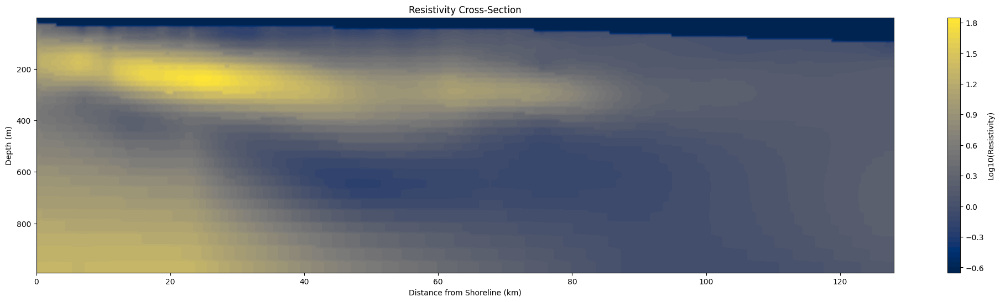

In [11]:
# Load the file (replace 'your_file_path.xyz' with the actual file path)
file_path = '/content/drive/MyDrive/Senior Project/MV_Joint_TMT10_MTerr10.emdata_extracted_mesh.xyz'
data = pd.read_csv(file_path, delim_whitespace=True, header=None)

# Rename columns based on your provided format
data.columns = ['UTM_X', 'UTM_Y', 'Depth', 'Log10_Rho_1', 'Log10_Rho_2', 'Log10_Rho_3']


# Extract UTM coordinates and other relevant data
utm_x = data['UTM_X'].values
utm_y = data['UTM_Y'].values
depth = data['Depth'].values
log_rho = data['Log10_Rho_1'].values  # Use only the first resistivity column

# Define shoreline point (first UTM coordinate)
shoreline_point = np.array([[utm_x[0], utm_y[0]]])

# Calculate distances from the shoreline in kilometers
distances = cdist(shoreline_point, np.column_stack((utm_x, utm_y))).flatten() / 1000  # Convert to km

# Create a processed DataFrame for plotting
processed_data = pd.DataFrame({
    'Distance_km': distances,
    'Depth': depth,
    'Log10_Rho': log_rho
})



# Create a grid for distances and depths
grid_distances, grid_depths = np.meshgrid(
    np.linspace(processed_data['Distance_km'].min(), processed_data['Distance_km'].max(), 500),
    np.linspace(processed_data['Depth'].min(), processed_data['Depth'].max(), 500)
)

# Interpolate resistivity values for the grid
grid_resistivity = griddata(
    points=(processed_data['Distance_km'], processed_data['Depth']),
    values=processed_data['Log10_Rho'],
    xi=(grid_distances, grid_depths),
    method='linear'
)

# Plot the resistivity cross-section
plt.figure(figsize=(25, 6))
contour = plt.contourf(grid_distances, grid_depths, grid_resistivity, cmap='cividis', levels=50)
plt.colorbar(contour, label='Log10(Resistivity)')
plt.xlabel('Distance from Shoreline (km)')
plt.ylabel('Depth (m)')
plt.title('Resistivity Cross-Section')
plt.gca().invert_yaxis()  # Depth increases downward
plt.show()

# Original Depth Converted Seismic Data (used for comparision and confidence in AGC data)


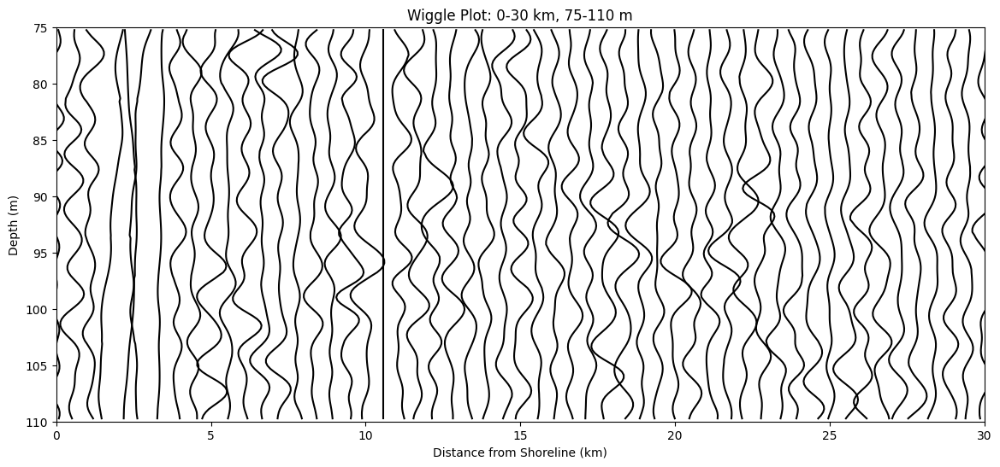

In [5]:
# Initialize the seismic data object
seismic_data = seismicgather()
npy_path = "/content/drive/MyDrive/Senior_Project/depth_converted_data.npy"
distance_range = (0, 100)  # Define the range based on your data
seismic_data.read_npy_data(npy_path, distance_range)

# Plot constrained wiggle plot
distance_min, distance_max = 0, 30  # Adjust as needed
depth_min, depth_max = 75, 110  # Adjust as needed
seismic_data.wiggle_plot_constrained(distance_min, distance_max, depth_min, depth_max, scale=0.6, trace_step=100, offset=0.0001)

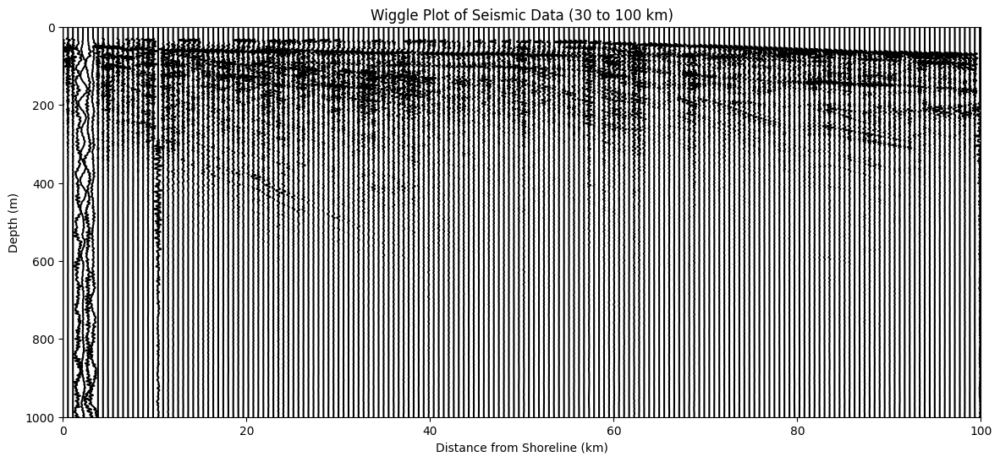

In [6]:
# Plot the wiggle plot with the distance axis flipped, focusing on the 30-100 km and 0-1000 m range
seismic_data.wiggle_plot_depth_distance(scale=0.5, trace_step=100)

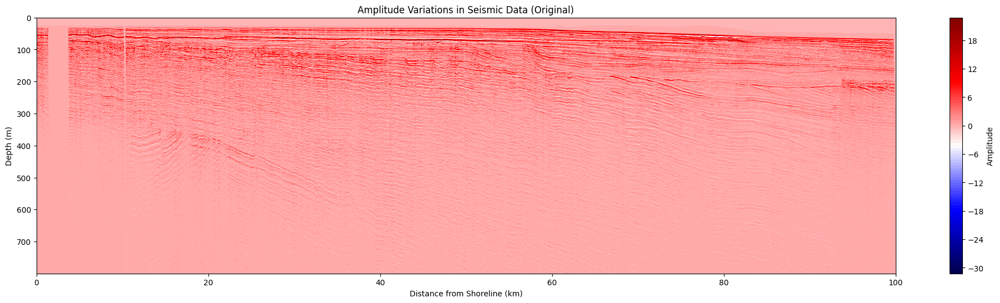

In [7]:
# 2 - Minute Runtime
# Isolate data
isolated_data = seismic_data.isolate_section(00, 100, 0, 800)

# Extract depth, distance, and amplitude values from isolated data
distance_values = np.array([trace[0] for trace in isolated_data])
depth_values = isolated_data[0][1]  # Depth values are the same for each trace in this range
amplitude_matrix = np.array([trace[2] for trace in isolated_data])

# Create a contour plot of the isolated section
plt.figure(figsize=(25, 6))
plt.contourf(distance_values, depth_values, amplitude_matrix.T, cmap="seismic", levels=100)
plt.colorbar(label="Amplitude")
plt.xlabel("Distance from Shoreline (km)")
plt.ylabel("Depth (m)")
plt.gca().invert_yaxis()
plt.title("Amplitude Variations in Seismic Data (Original)")
plt.show()

# AGC Corrected Depth Converted Data

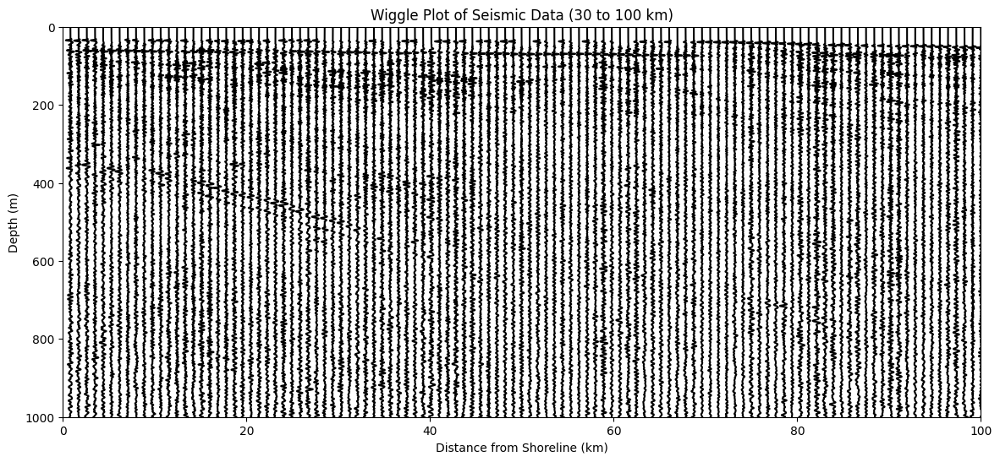

In [8]:
# Initialize the seismic data object and read SEG-Y data
seismic_data_agc = seismicgather()
segy_path = "/content/drive/MyDrive/Senior Project/filtered_agc_seismic_data.sgy"
seismic_data_agc.read_segy_data(segy_path)

# Plot the wiggle plot with the distance axis flipped, focusing on the 30-100 km and 0-1000 m range
seismic_data_agc.wiggle_plot_depth_distance(scale=0.5, trace_step=100)

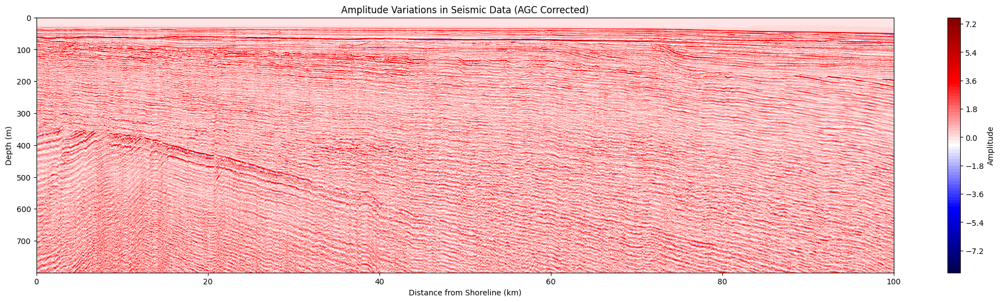

In [9]:
# 2-Minute Runtime
# Isolate data
isolated_data = seismic_data_agc.isolate_section(00, 100, 0, 800)

# Extract depth, distance, and amplitude values from isolated data
distance_values = np.array([trace[0] for trace in isolated_data])
depth_values = isolated_data[0][1]  # Depth values are the same for each trace in this range
amplitude_matrix = np.array([trace[2] for trace in isolated_data])

# Create a contour plot of the isolated section
plt.figure(figsize=(25, 6))
plt.contourf(distance_values, depth_values, amplitude_matrix.T, cmap="seismic", levels=100)
plt.colorbar(label="Amplitude")
plt.xlabel("Distance from Shoreline (km)")
plt.ylabel("Depth (m)")
plt.gca().invert_yaxis()
plt.title("Amplitude Variations in Seismic Data (AGC Corrected)")
plt.show()

# Known Freshwater-Saltwater Boundary (determined through acoustic impedance inspection and further trial and error)

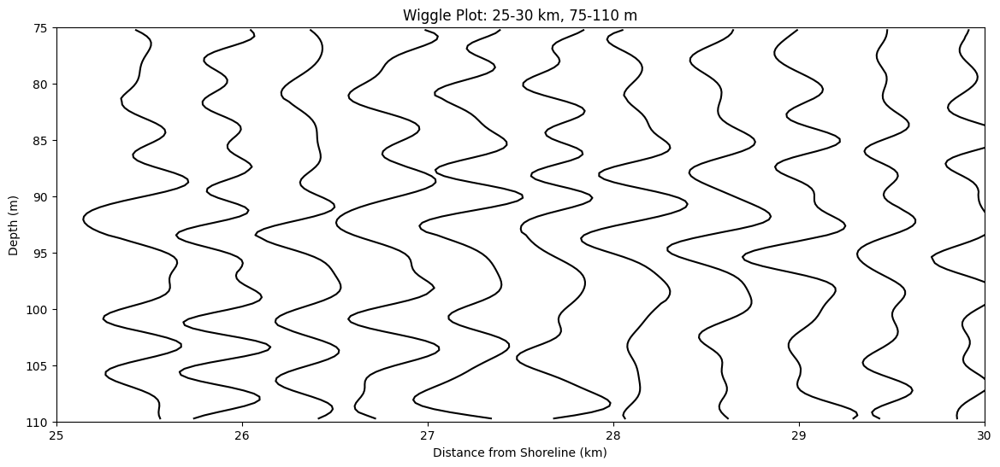

In [10]:
# Plot constrained wiggle plot
distance_min, distance_max = 25, 30  # Adjust as needed
depth_min, depth_max = 75, 110   # Adjust as needed
seismic_data_agc.wiggle_plot_constrained(distance_min, distance_max, depth_min, depth_max, scale=0.6, trace_step=50, offset=0.00001)

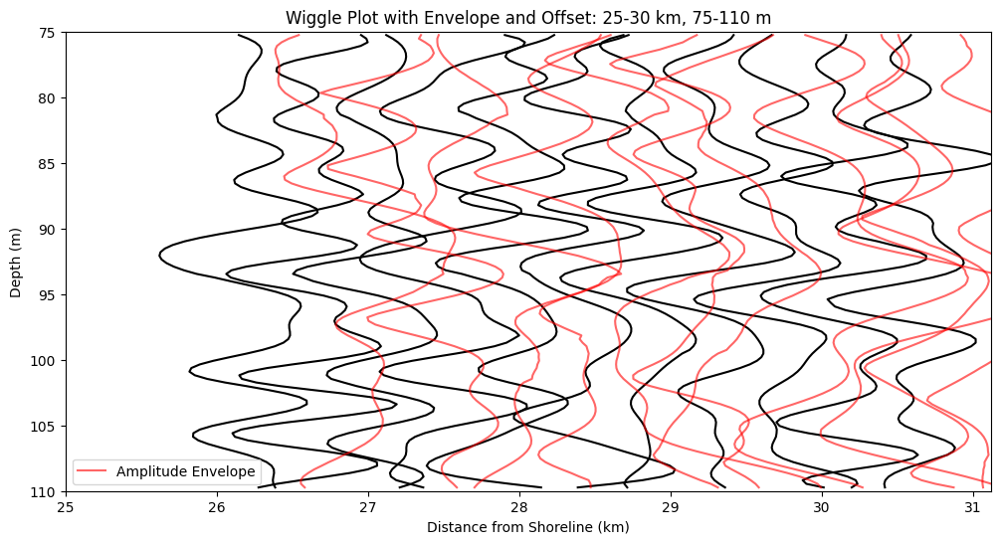

In [11]:
# Generate a wiggle plot with envelopes for the constrained range
seismic_data_agc.wiggle_plot_with_envelope(
    distance_min=distance_min,  # Minimum distance from shoreline (km)
    distance_max=distance_max,  # Maximum distance from shoreline (km)
    depth_min=depth_min,     # Minimum depth (m)
    depth_max=depth_max,    # Maximum depth (m)
    scale=0.6,        # Scale factor for trace visualization
    trace_step=50,     # Plot every 2nd trace
    offset=0.0001        # Offset to separate traces visually
)

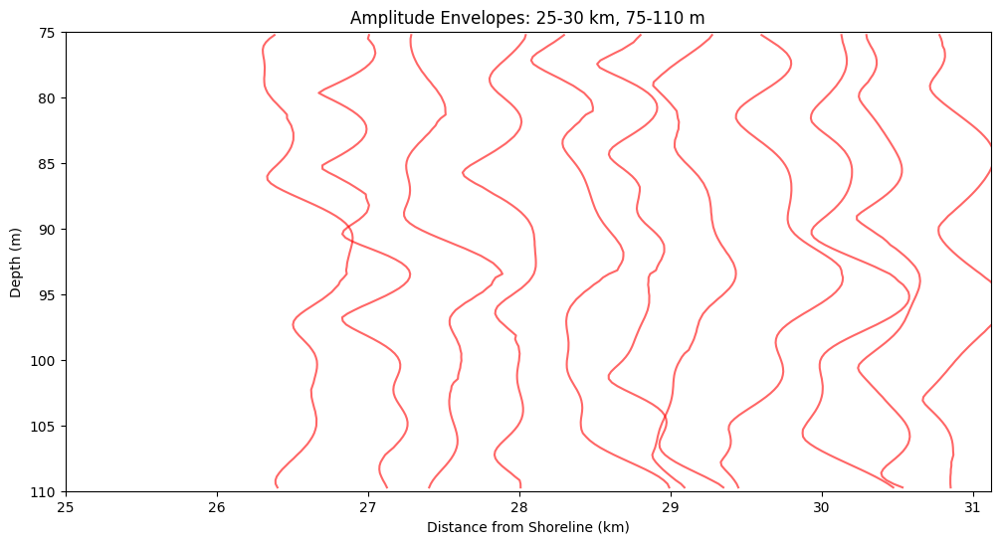

In [12]:
# Plot envelopes only
seismic_data_agc.plot_only_envelopes(
    distance_min=distance_min,
    distance_max=distance_max,
    depth_min=depth_min,
    depth_max=depth_max,
    trace_step=50,
    offset=0.0001,
    scale=0.3
)

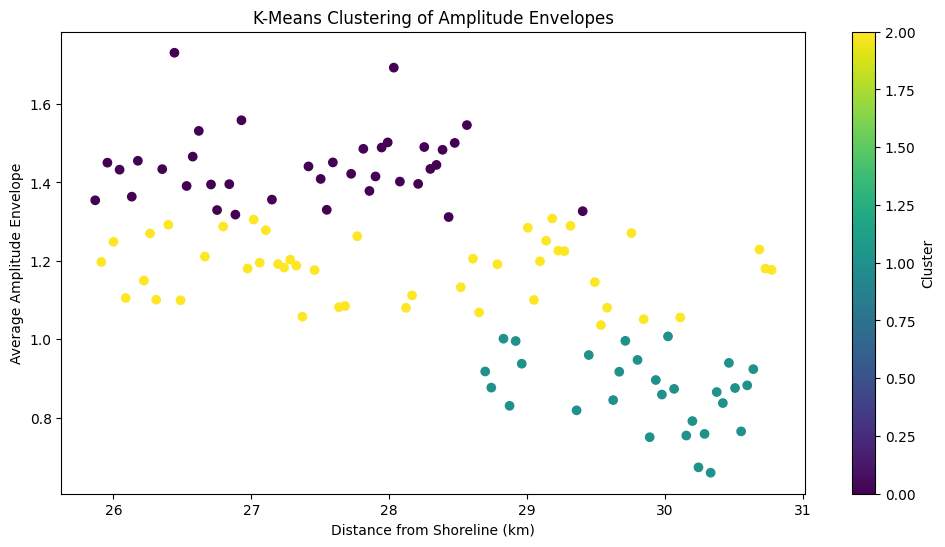

array([2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2,
       1, 2, 1, 1, 1, 2, 2, 2, 1, 0, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1,
       1, 2, 1, 1, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0,
       0, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0,
       0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 2, 0,
       2, 0], dtype=int32)

In [13]:
# Perform clustering
seismic_data_agc.cluster_envelopes(distance_min, distance_max, depth_min, depth_max, trace_step=5, offset=0.0001, scale=1, num_clusters=3)

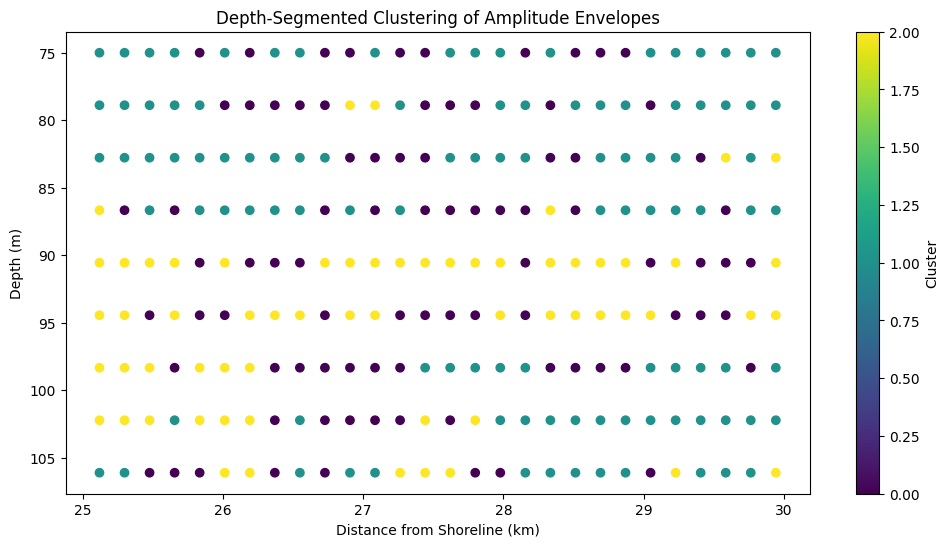

In [14]:
segment_df = seismic_data_agc.depth_segmented_clustering(
    distance_min=distance_min,
    distance_max=distance_max,
    depth_min=depth_min,
    depth_max=depth_max,
    n_clusters=3,
    trace_step=20,
    offset=0.0001,
    scale=0.6
)

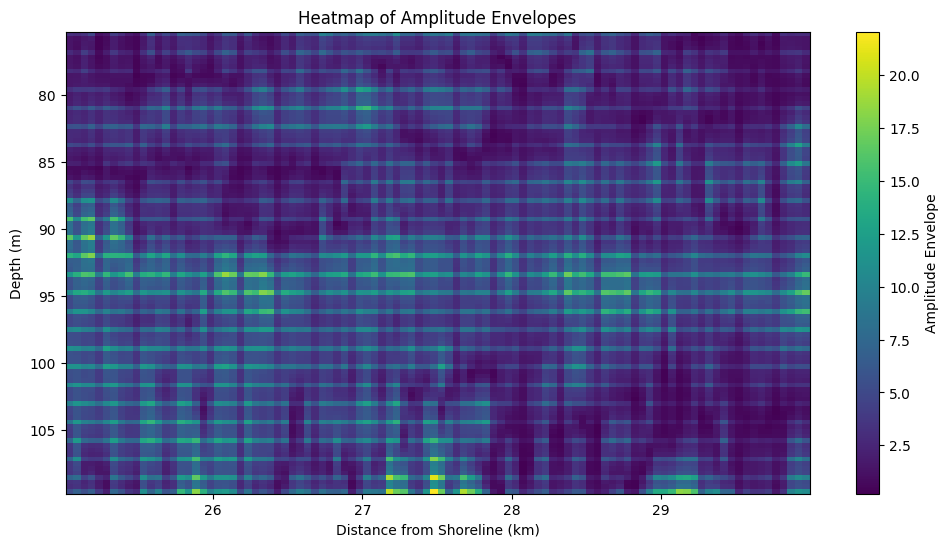

In [15]:
seismic_data_agc.plot_envelope_heatmap(
    distance_min=distance_min,
    distance_max=distance_max,
    depth_min=depth_min,
    depth_max=depth_max,
    trace_step=2,
    offset=0.0001,
    scale=0.6
)


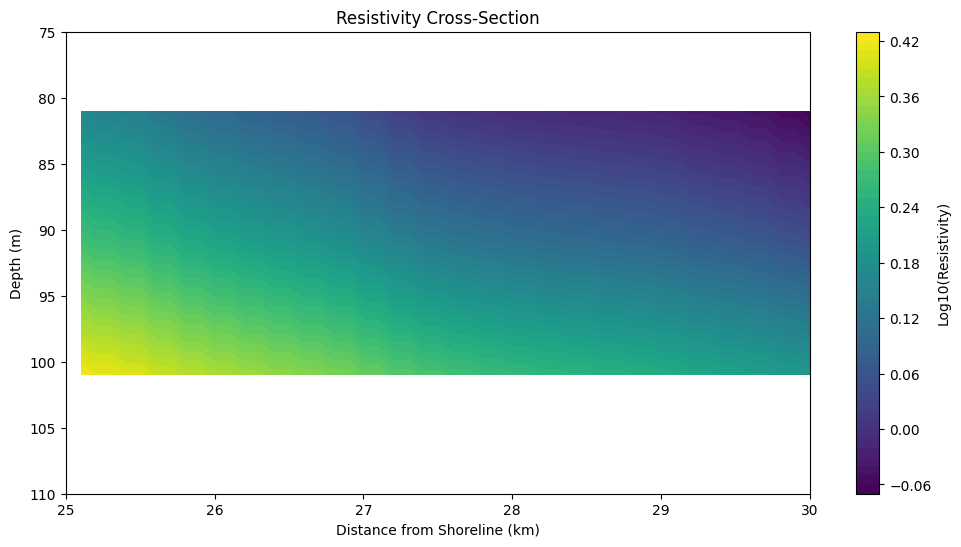

In [16]:
# Filter the data again using the corrected distances in kilometers
filtered_data = processed_data[
    (processed_data['Depth'] >= depth_min) &
    (processed_data['Depth'] <= depth_max) &
    (processed_data['Distance_km'] >= distance_min) &
    (processed_data['Distance_km'] <= distance_max)
]

# Ensure there are points in the filtered range
if not filtered_data.empty:
    # Create a grid for the filtered data
    grid_distances_filtered, grid_depths_filtered = np.meshgrid(
        np.linspace(distance_min, distance_max, 1000),
        np.linspace(depth_min, depth_max, 1000)
    )

    # Interpolate resistivity values for the filtered grid
    grid_resistivity_filtered = griddata(
        points=(filtered_data['Distance_km'], filtered_data['Depth']),
        values=filtered_data['Log10_Rho'],
        xi=(grid_distances_filtered, grid_depths_filtered),
        method='linear'
    )

    # Plot the resistivity cross-section for the selected range
    plt.figure(figsize=(12, 6))  # Adjust figure size for the zoomed-in view
    contour_filtered = plt.contourf(
        grid_distances_filtered,
        grid_depths_filtered,
        grid_resistivity_filtered,
        cmap='viridis',
        levels=50
    )
    plt.colorbar(contour_filtered, label='Log10(Resistivity)')
    plt.xlabel('Distance from Shoreline (km)')
    plt.ylabel('Depth (m)')
    plt.title('Resistivity Cross-Section')
    plt.gca().invert_yaxis()  # Depth increases downward
    plt.show()
else:
    print("No data points available in the specified depth and distance range.")


## Correlation Coefficents - Freshwater-Saltwater Boundary

In [17]:
# Interpolate seismic envelope data onto the resistivity grid
# Extract seismic envelopes in the same constrained window
distances, depths, envelopes = seismic_data_agc.calculate_amplitude_envelope(
    distance_min, distance_max, depth_min, depth_max, trace_step=50, offset=0.0001
)

# Flatten depths and envelopes
depths_flat = np.hstack(depths)  # Combine depth arrays
envelopes_flat = np.hstack(envelopes)  # Combine envelope arrays

# Expand distances to match depths (repeat each distance for all corresponding depths)
distances_flat = np.repeat(distances, [len(d) for d in depths])  # Match lengths

# Ensure points and values align
points = np.column_stack((distances_flat, depths_flat))  # Create [N, 2] points array

# Interpolate seismic envelopes to match resistivity grid
seismic_grid_envelopes = griddata(
    points=points,                  # [N, 2] points array
    values=envelopes_flat,          # Flattened envelope values
    xi=(grid_distances_filtered, grid_depths_filtered),  # Resistivity grid
    method="linear"
)

# Verify if dimensions match
assert seismic_grid_envelopes.shape == grid_resistivity_filtered.shape, "Grid shapes do not match!"

# Calculate correlation coefficient
correlation_coefficient = np.corrcoef(
    seismic_grid_envelopes.flatten(), grid_resistivity_filtered.flatten()
)[0, 1]
print(f"Correlation Coefficient: {correlation_coefficient}")

Correlation Coefficient: nan


In [18]:
# Remove NaN values from seismic and resistivity data
valid_mask = ~np.isnan(seismic_grid_envelopes) & ~np.isnan(grid_resistivity_filtered)
seismic_clean = seismic_grid_envelopes[valid_mask]
resistivity_clean = grid_resistivity_filtered[valid_mask]
depths_clean = grid_depths_filtered[valid_mask]

# Segment and calculate correlations by depth range
depth_segments = np.linspace(depth_min, depth_max, num=5)  # Divide depth into 5 segments
for i in range(len(depth_segments) - 1):
    # Create a mask for the current depth segment
    segment_mask = (depths_clean >= depth_segments[i]) & (depths_clean < depth_segments[i+1])

    # Check if there's valid data in the segment
    if segment_mask.any():
        segment_seismic = seismic_clean[segment_mask]
        segment_resistivity = resistivity_clean[segment_mask]

        # Calculate correlation coefficient
        if len(segment_seismic) > 1 and len(segment_resistivity) > 1:  # Ensure enough data points
            segment_correlation = np.corrcoef(segment_seismic, segment_resistivity)[0, 1]
            print(f"Correlation for depth range {depth_segments[i]}-{depth_segments[i+1]}: {segment_correlation}")
        else:
            print(f"Not enough data points for depth range {depth_segments[i]}-{depth_segments[i+1]}")
    else:
        print(f"No valid data for depth range {depth_segments[i]}-{depth_segments[i+1]}")


Correlation for depth range 75.0-83.75: 0.2491070425348837
Correlation for depth range 83.75-92.5: 0.15457224284896134
Correlation for depth range 92.5-101.25: -0.45599484249873573
No valid data for depth range 101.25-110.0


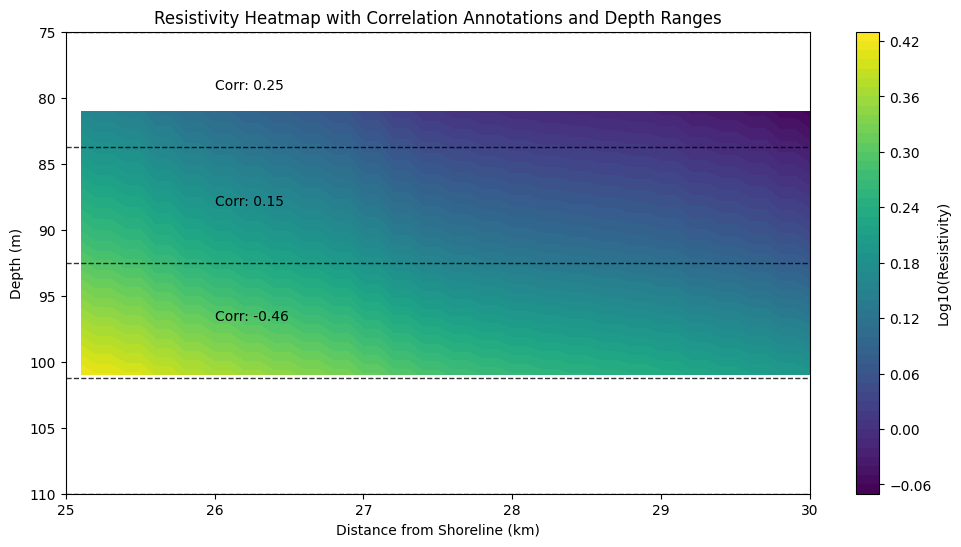

In [19]:
# Store segment correlations
segment_correlations = []

# Segment and calculate correlations by depth range
for i in range(len(depth_segments) - 1):
    segment_mask = (depths_clean >= depth_segments[i]) & (depths_clean < depth_segments[i+1])

    if segment_mask.any():
        segment_seismic = seismic_clean[segment_mask]
        segment_resistivity = resistivity_clean[segment_mask]

        if len(segment_seismic) > 1 and len(segment_resistivity) > 1:
            correlation = np.corrcoef(segment_seismic, segment_resistivity)[0, 1]
            segment_correlations.append(correlation)
        else:
            segment_correlations.append(np.nan)  # Not enough data points
    else:
        segment_correlations.append(np.nan)  # No valid data for this segment

# Heatmap with annotation for correlations
plt.figure(figsize=(12, 6))

# Plot the resistivity heatmap
plt.contourf(grid_distances_filtered, grid_depths_filtered, grid_resistivity_filtered, cmap='viridis', levels=50)
plt.colorbar(label='Log10(Resistivity)')

# Add dashed lines for each depth range
for i in range(len(depth_segments)):
    plt.axhline(depth_segments[i], color='black', linestyle='--', linewidth=1.0, alpha=0.8)

# Annotate the plot with segment correlations
for i, correlation in enumerate(segment_correlations):
    if not np.isnan(correlation):  # Skip annotations for NaN values
        mid_depth = (depth_segments[i] + depth_segments[i + 1]) / 2
        plt.text(
            distance_min + 1, mid_depth,
            f"Corr: {correlation:.2f}", color='black', fontsize=10
        )

# Set plot labels and formatting
plt.xlabel("Distance from Shoreline (km)")
plt.ylabel("Depth (m)")
plt.title("Resistivity Heatmap with Correlation Annotations and Depth Ranges")
plt.gca().invert_yaxis()  # Depth increases downward
plt.show()


# Known Saltwater-Saltwater Boundary

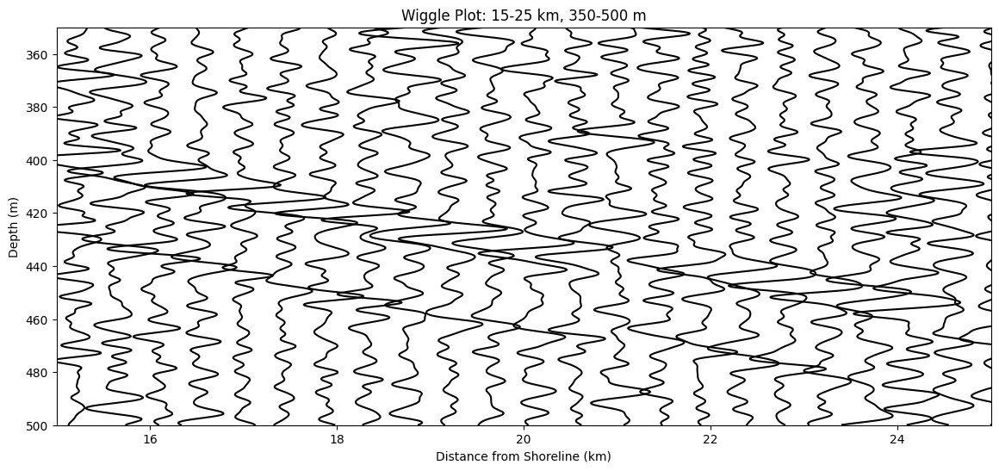

In [20]:
# Plot constrained wiggle plot
distance_min, distance_max = 15, 25  # Adjust as needed
depth_min, depth_max = 350, 500   # Adjust as needed
seismic_data_agc.wiggle_plot_constrained(distance_min, distance_max, depth_min, depth_max, scale=0.6, trace_step=50, offset=0.00001)

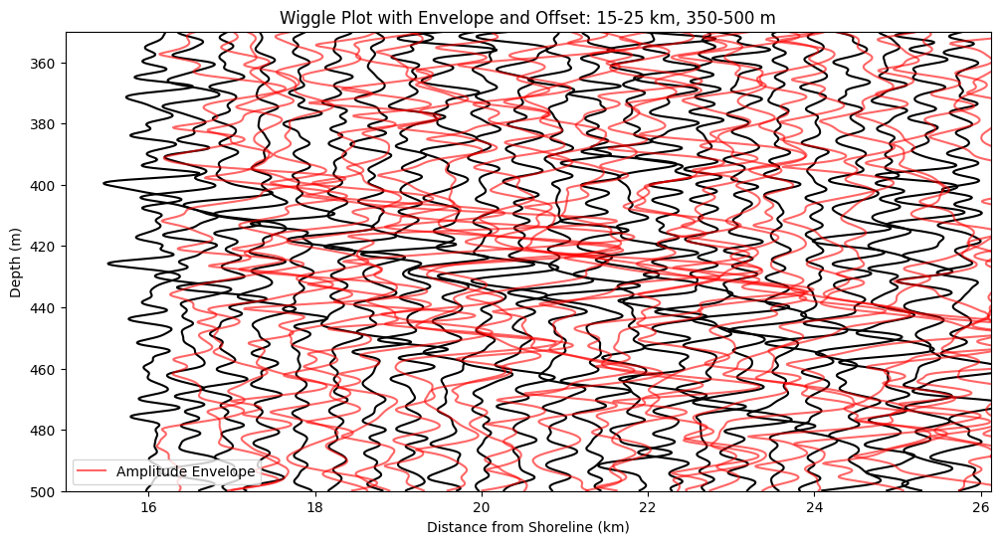

In [21]:
# Generate a wiggle plot with envelopes for the constrained range
seismic_data_agc.wiggle_plot_with_envelope(
    distance_min=distance_min,  # Minimum distance from shoreline (km)
    distance_max=distance_max,  # Maximum distance from shoreline (km)
    depth_min=depth_min,     # Minimum depth (m)
    depth_max=depth_max,    # Maximum depth (m)
    scale=0.6,        # Scale factor for trace visualization
    trace_step=50,     # Plot every 2nd trace
    offset=0.0001        # Offset to separate traces visually
)

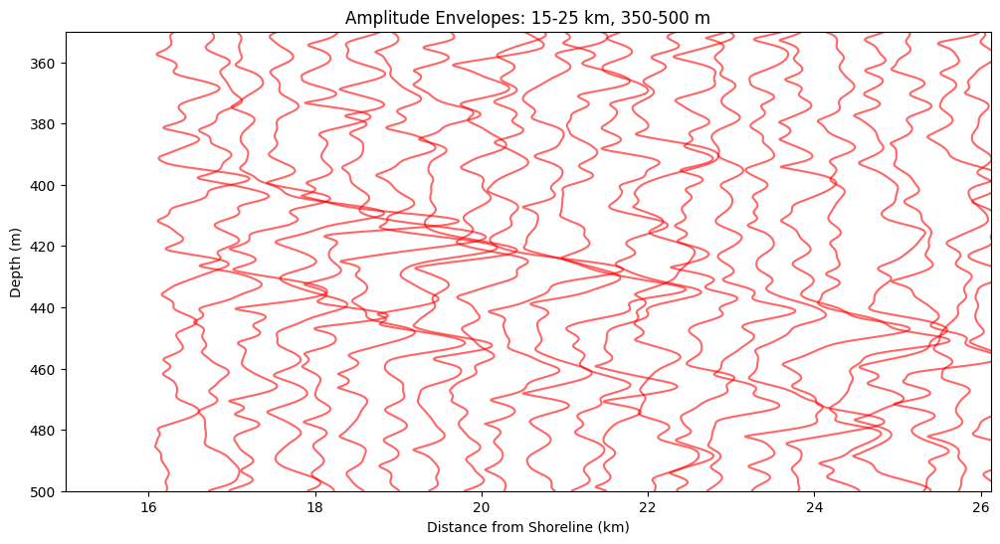

In [22]:
# Plot envelopes only
seismic_data_agc.plot_only_envelopes(
    distance_min=distance_min,
    distance_max=distance_max,
    depth_min=depth_min,
    depth_max=depth_max,
    trace_step=50,
    offset=0.0001,
    scale=0.3
)

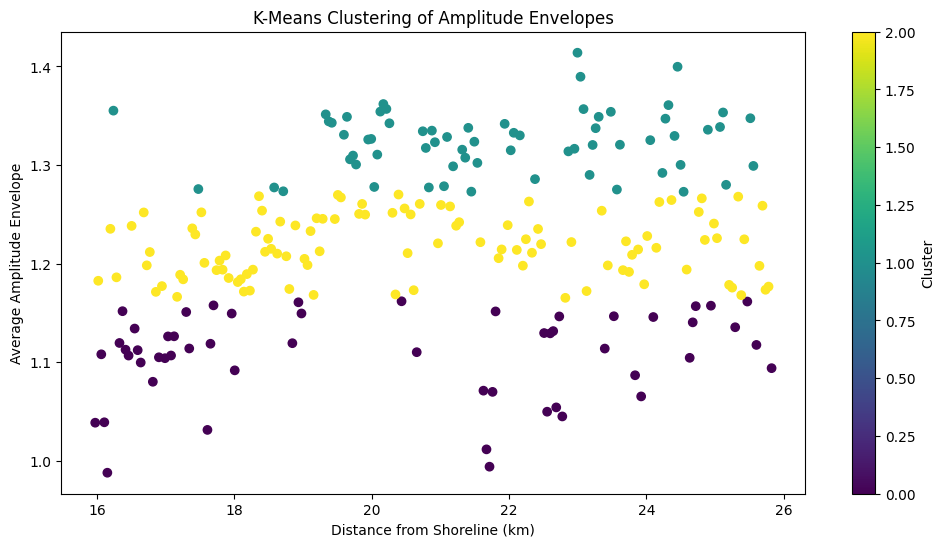

array([0, 2, 2, 2, 2, 0, 1, 1, 0, 2, 2, 2, 0, 2, 2, 1, 1, 1, 2, 2, 0, 1,
       2, 2, 2, 0, 0, 0, 2, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 0, 1, 2, 2, 0,
       2, 0, 2, 2, 2, 2, 1, 1, 0, 1, 2, 0, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1,
       2, 1, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 1, 2, 2, 2, 2, 1, 2, 1, 1, 2,
       1, 2, 2, 0, 0, 0, 0, 0, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 1, 1, 2,
       2, 1, 1, 1, 1, 1, 2, 0, 2, 2, 2, 2, 0, 2, 2, 2, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2,
       2, 0, 0, 2, 0, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 1, 2, 2, 0, 0, 2, 2, 2, 0,
       0, 0, 0, 2, 0, 2, 0, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 1, 2, 0,
       0, 0, 2, 0], dtype=int32)

In [23]:
# Perform clustering
seismic_data_agc.cluster_envelopes(distance_min, distance_max, depth_min, depth_max, trace_step=5, offset=0.0001, scale=1, num_clusters=3)

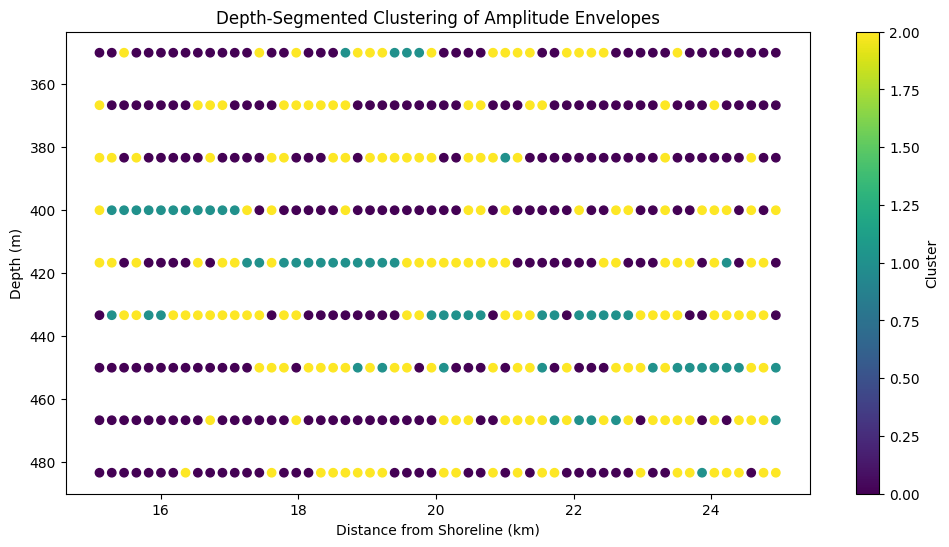

In [24]:
segment_df = seismic_data_agc.depth_segmented_clustering(
    distance_min=distance_min,
    distance_max=distance_max,
    depth_min=depth_min,
    depth_max=depth_max,
    n_clusters=3,
    trace_step=20,
    offset=0.0001,
    scale=0.6
)

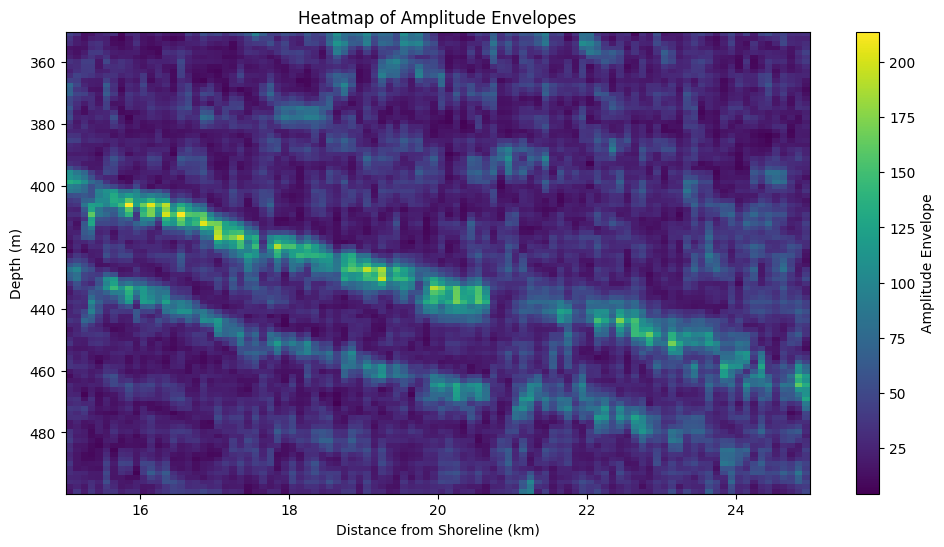

In [25]:
seismic_data_agc.plot_envelope_heatmap(
    distance_min=distance_min,
    distance_max=distance_max,
    depth_min=depth_min,
    depth_max=depth_max,
    trace_step=2,
    offset=0.0001,
    scale=0.6
)

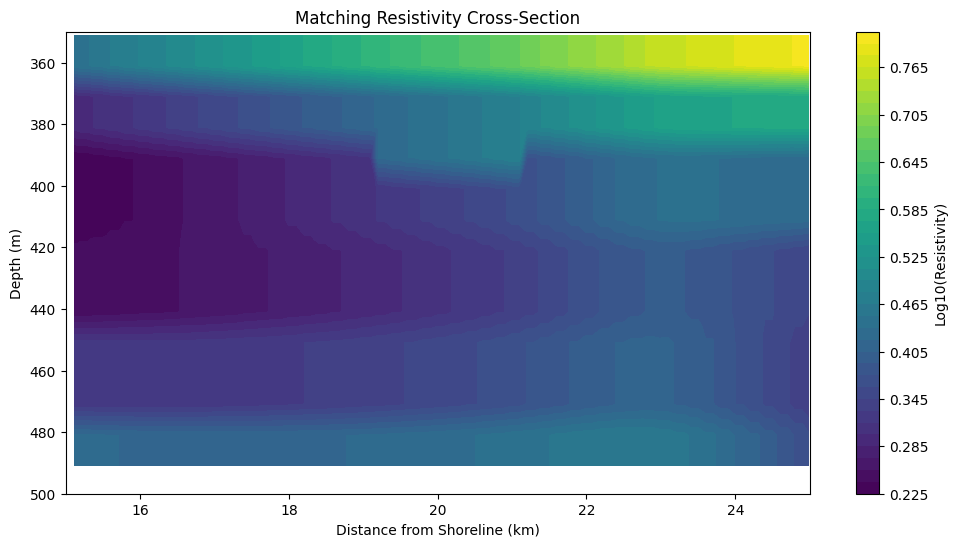

In [26]:
# Filter the data again using the corrected distances in kilometers
filtered_data = processed_data[
    (processed_data['Depth'] >= depth_min) &
    (processed_data['Depth'] <= depth_max) &
    (processed_data['Distance_km'] >= distance_min) &
    (processed_data['Distance_km'] <= distance_max)
]

# Ensure there are points in the filtered range
if not filtered_data.empty:
    # Create a grid for the filtered data
    grid_distances_filtered, grid_depths_filtered = np.meshgrid(
        np.linspace(distance_min, distance_max, 500),
        np.linspace(depth_min, depth_max, 500)
    )

    # Interpolate resistivity values for the filtered grid
    grid_resistivity_filtered = griddata(
        points=(filtered_data['Distance_km'], filtered_data['Depth']),
        values=filtered_data['Log10_Rho'],
        xi=(grid_distances_filtered, grid_depths_filtered),
        method='linear'
    )

    # Plot the resistivity cross-section for the selected range
    plt.figure(figsize=(12, 6))  # Adjust figure size for the zoomed-in view
    contour_filtered = plt.contourf(
        grid_distances_filtered,
        grid_depths_filtered,
        grid_resistivity_filtered,
        cmap='viridis',
        levels=50
    )
    plt.colorbar(contour_filtered, label='Log10(Resistivity)')
    plt.xlabel('Distance from Shoreline (km)')
    plt.ylabel('Depth (m)')
    plt.title('Matching Resistivity Cross-Section')
    plt.gca().invert_yaxis()  # Depth increases downward
    plt.show()
else:
    print("No data points available in the specified depth and distance range.")

# Correlation Coefficents - Saltwater-Saltwater



In [27]:
# Interpolate seismic envelope data onto the resistivity grid
# Extract seismic envelopes in the same constrained window
distances, depths, envelopes = seismic_data_agc.calculate_amplitude_envelope(
    distance_min, distance_max, depth_min, depth_max, trace_step=50, offset=0.0001
)

# Flatten depths and envelopes
depths_flat = np.hstack(depths)  # Combine depth arrays
envelopes_flat = np.hstack(envelopes)  # Combine envelope arrays

# Expand distances to match depths (repeat each distance for all corresponding depths)
distances_flat = np.repeat(distances, [len(d) for d in depths])  # Match lengths

# Ensure points and values align
points = np.column_stack((distances_flat, depths_flat))  # Create [N, 2] points array

# Interpolate seismic envelopes to match resistivity grid
seismic_grid_envelopes = griddata(
    points=points,                  # [N, 2] points array
    values=envelopes_flat,          # Flattened envelope values
    xi=(grid_distances_filtered, grid_depths_filtered),  # Resistivity grid
    method="linear"
)

# Verify if dimensions match
assert seismic_grid_envelopes.shape == grid_resistivity_filtered.shape, "Grid shapes do not match!"

# Calculate correlation coefficient
correlation_coefficient = np.corrcoef(
    seismic_grid_envelopes.flatten(), grid_resistivity_filtered.flatten()
)[0, 1]
print(f"Correlation Coefficient: {correlation_coefficient}")

Correlation Coefficient: nan


In [28]:
# Remove NaN values from seismic and resistivity data
valid_mask = ~np.isnan(seismic_grid_envelopes) & ~np.isnan(grid_resistivity_filtered)
seismic_clean = seismic_grid_envelopes[valid_mask]
resistivity_clean = grid_resistivity_filtered[valid_mask]
depths_clean = grid_depths_filtered[valid_mask]

# Segment and calculate correlations by depth range
depth_segments = np.linspace(depth_min, depth_max, num=5)  # Divide depth into 5 segments
for i in range(len(depth_segments) - 1):
    # Create a mask for the current depth segment
    segment_mask = (depths_clean >= depth_segments[i]) & (depths_clean < depth_segments[i+1])

    # Check if there's valid data in the segment
    if segment_mask.any():
        segment_seismic = seismic_clean[segment_mask]
        segment_resistivity = resistivity_clean[segment_mask]

        # Calculate correlation coefficient
        if len(segment_seismic) > 1 and len(segment_resistivity) > 1:  # Ensure enough data points
            segment_correlation = np.corrcoef(segment_seismic, segment_resistivity)[0, 1]
            print(f"Correlation for depth range {depth_segments[i]}-{depth_segments[i+1]}: {segment_correlation}")
        else:
            print(f"Not enough data points for depth range {depth_segments[i]}-{depth_segments[i+1]}")
    else:
        print(f"No valid data for depth range {depth_segments[i]}-{depth_segments[i+1]}")


Correlation for depth range 350.0-387.5: -0.01859714698647015
Correlation for depth range 387.5-425.0: -0.28121832299751054
Correlation for depth range 425.0-462.5: -0.003208985126604111
Correlation for depth range 462.5-500.0: 0.034174752050812864


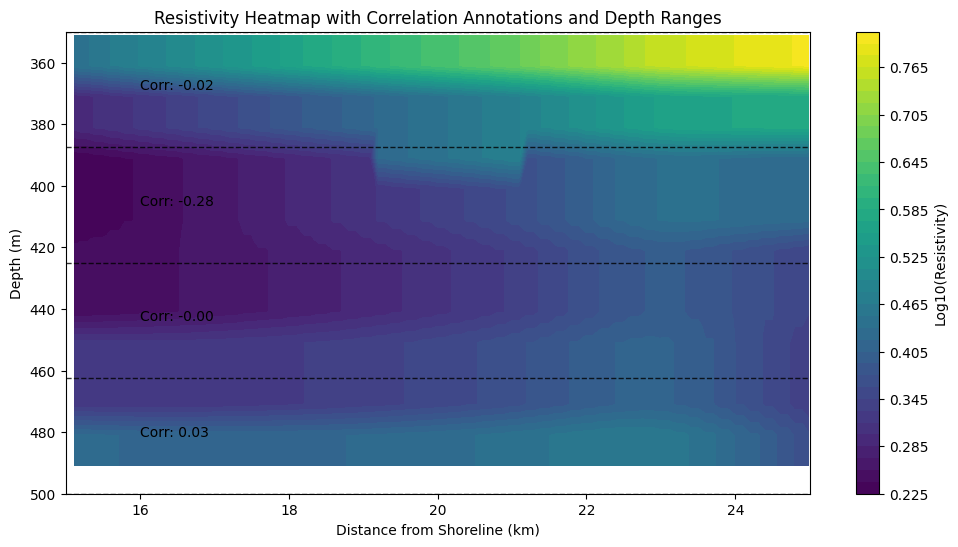

In [29]:
# Store segment correlations
segment_correlations = []

# Segment and calculate correlations by depth range
for i in range(len(depth_segments) - 1):
    segment_mask = (depths_clean >= depth_segments[i]) & (depths_clean < depth_segments[i+1])

    if segment_mask.any():
        segment_seismic = seismic_clean[segment_mask]
        segment_resistivity = resistivity_clean[segment_mask]

        if len(segment_seismic) > 1 and len(segment_resistivity) > 1:
            correlation = np.corrcoef(segment_seismic, segment_resistivity)[0, 1]
            segment_correlations.append(correlation)
        else:
            segment_correlations.append(np.nan)  # Not enough data points
    else:
        segment_correlations.append(np.nan)  # No valid data for this segment

# Heatmap with annotation for correlations
plt.figure(figsize=(12, 6))

# Plot the resistivity heatmap
plt.contourf(grid_distances_filtered, grid_depths_filtered, grid_resistivity_filtered, cmap='viridis', levels=50)
plt.colorbar(label='Log10(Resistivity)')

# Add dashed lines for each depth range
for i in range(len(depth_segments)):
    plt.axhline(depth_segments[i], color='black', linestyle='--', linewidth=1.0, alpha=0.8)

# Annotate the plot with segment correlations
for i, correlation in enumerate(segment_correlations):
    if not np.isnan(correlation):  # Skip annotations for NaN values
        mid_depth = (depth_segments[i] + depth_segments[i + 1]) / 2
        plt.text(
            distance_min + 1, mid_depth,
            f"Corr: {correlation:.2f}", color='black', fontsize=10
        )

# Set plot labels and formatting
plt.xlabel("Distance from Shoreline (km)")
plt.ylabel("Depth (m)")
plt.title("Resistivity Heatmap with Correlation Annotations and Depth Ranges")
plt.gca().invert_yaxis()  # Depth increases downward
plt.show()

# Calculation for entire section

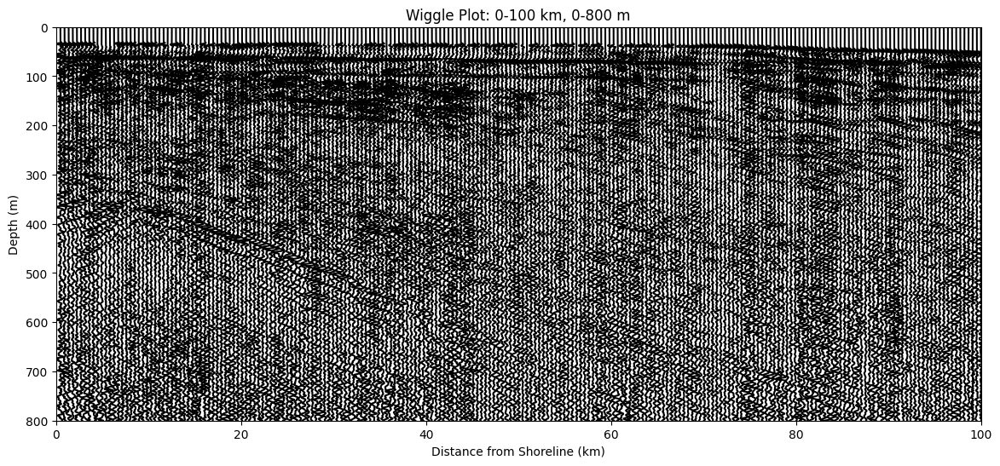

In [13]:
# Initialize the seismic data object and read SEG-Y data
seismic_data_agc = seismicgather()
segy_path = "/content/drive/MyDrive/Senior Project/filtered_agc_seismic_data.sgy"
seismic_data_agc.read_segy_data(segy_path)

# Plot constrained wiggle plot
distance_min, distance_max = 0, 100  # Adjust as needed
depth_min, depth_max = 0, 800   # Adjust as needed
seismic_data_agc.wiggle_plot_constrained(distance_min, distance_max, depth_min, depth_max, scale=0.6, trace_step=50, offset=0.00001)

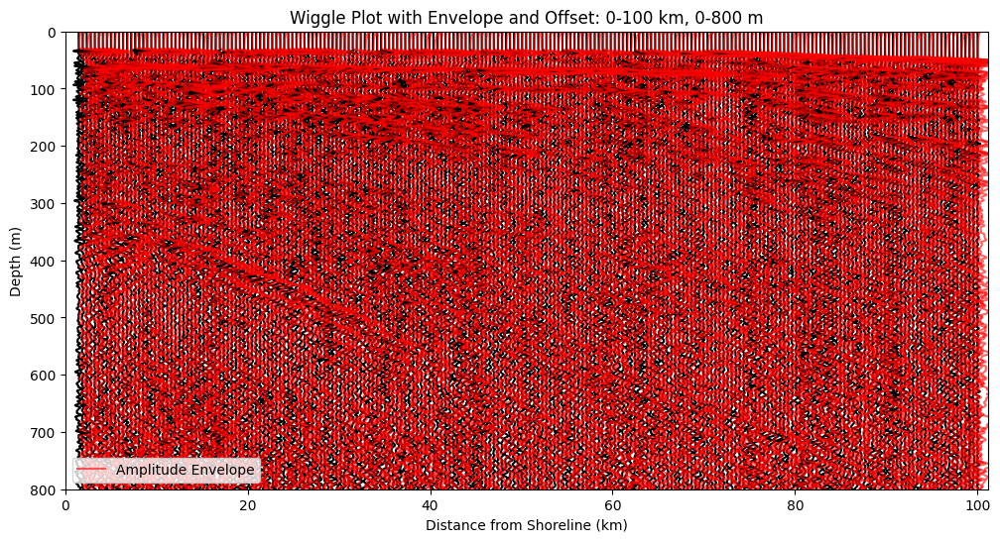

In [14]:
# Generate a wiggle plot with envelopes for the constrained range
seismic_data_agc.wiggle_plot_with_envelope(
    distance_min=distance_min,  # Minimum distance from shoreline (km)
    distance_max=distance_max,  # Maximum distance from shoreline (km)
    depth_min=depth_min,     # Minimum depth (m)
    depth_max=depth_max,    # Maximum depth (m)
    scale=0.6,        # Scale factor for trace visualization
    trace_step=50,     # Plot every 2nd trace
    offset=0.0001        # Offset to separate traces visually
)

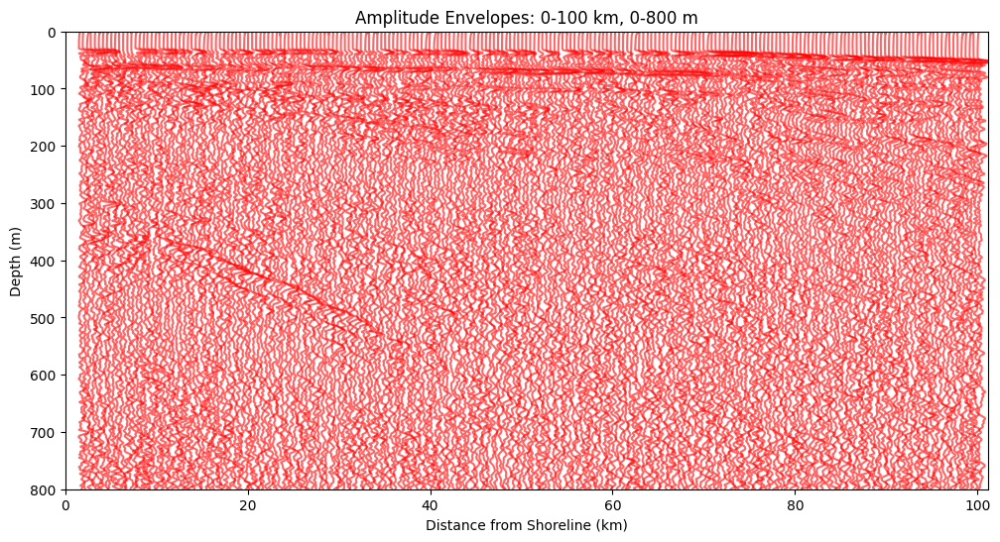

In [15]:
# Plot envelopes only
seismic_data_agc.plot_only_envelopes(
    distance_min=distance_min,
    distance_max=distance_max,
    depth_min=depth_min,
    depth_max=depth_max,
    trace_step=50,
    offset=0.0001,
    scale=0.3
)

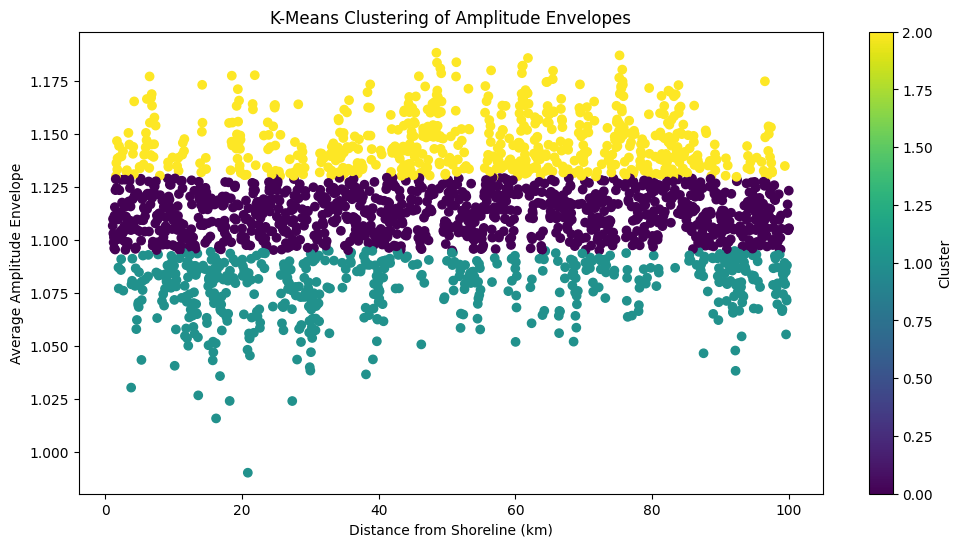

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [16]:
# Perform clustering
seismic_data_agc.cluster_envelopes(distance_min, distance_max, depth_min, depth_max, trace_step=5, offset=0.0001, scale=1, num_clusters=3)

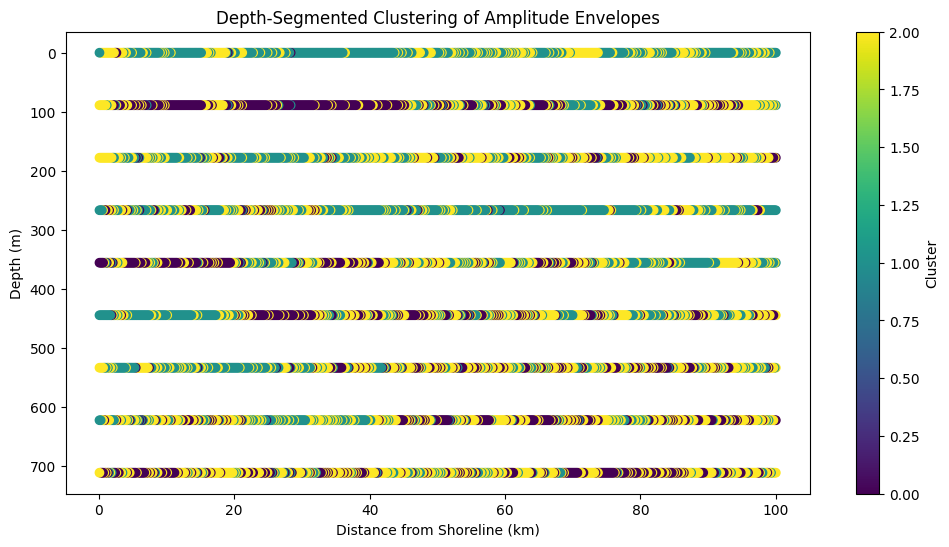

In [17]:
segment_df = seismic_data_agc.depth_segmented_clustering(
    distance_min=distance_min,
    distance_max=distance_max,
    depth_min=depth_min,
    depth_max=depth_max,
    n_clusters=3,
    trace_step=20,
    offset=0.0001,
    scale=0.6
)

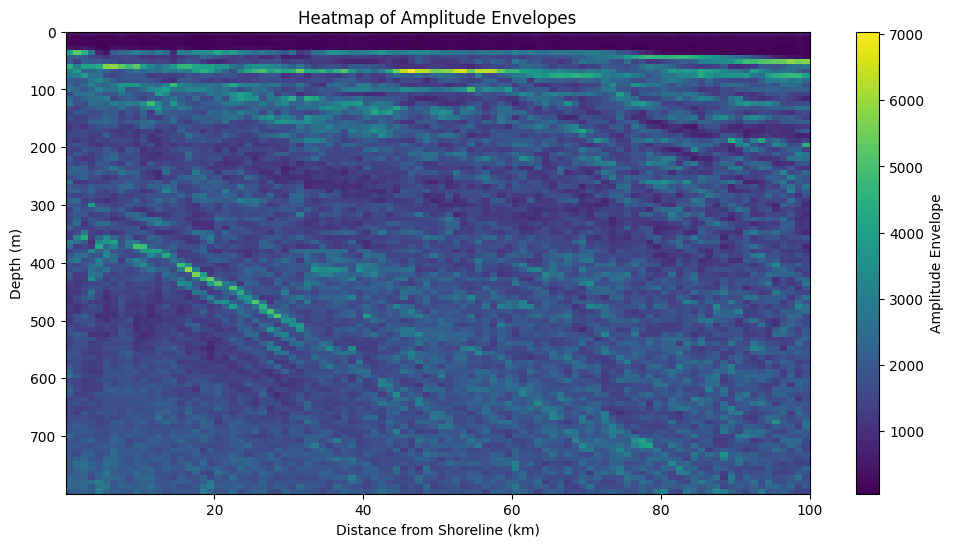

In [18]:
seismic_data_agc.plot_envelope_heatmap(
    distance_min=distance_min,
    distance_max=distance_max,
    depth_min=depth_min,
    depth_max=depth_max,
    trace_step=2,
    offset=0.0001,
    scale=0.6
)

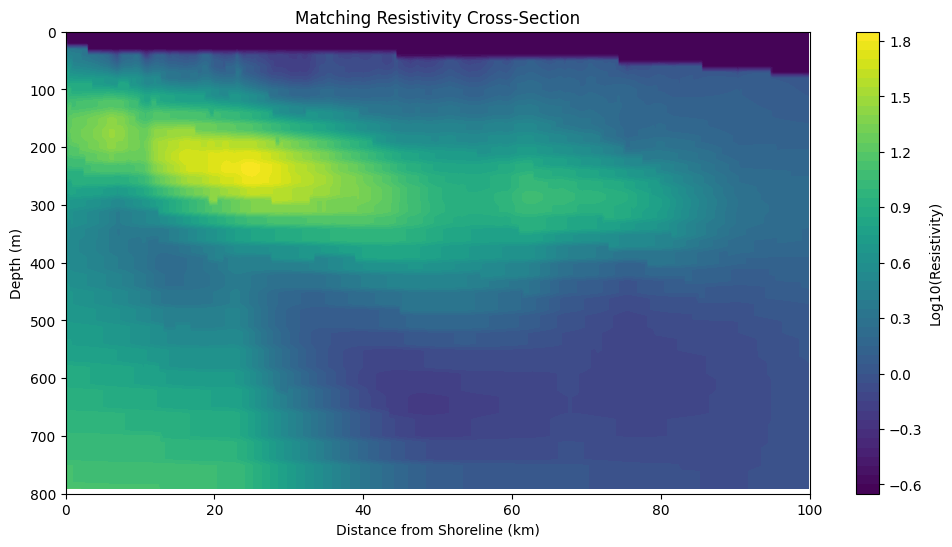

In [21]:
# Filter the data again using the corrected distances in kilometers
filtered_data = processed_data[
    (processed_data['Depth'] >= depth_min) &
    (processed_data['Depth'] <= depth_max) &
    (processed_data['Distance_km'] >= distance_min) &
    (processed_data['Distance_km'] <= distance_max)
]

# Ensure there are points in the filtered range
if not filtered_data.empty:
    # Create a grid for the filtered data
    grid_distances_filtered, grid_depths_filtered = np.meshgrid(
        np.linspace(distance_min, distance_max, 500),
        np.linspace(depth_min, depth_max, 500)
    )

    # Interpolate resistivity values for the filtered grid
    grid_resistivity_filtered = griddata(
        points=(filtered_data['Distance_km'], filtered_data['Depth']),
        values=filtered_data['Log10_Rho'],
        xi=(grid_distances_filtered, grid_depths_filtered),
        method='linear'
    )

    # Plot the resistivity cross-section for the selected range
    plt.figure(figsize=(12, 6))  # Adjust figure size for the zoomed-in view
    contour_filtered = plt.contourf(
        grid_distances_filtered,
        grid_depths_filtered,
        grid_resistivity_filtered,
        cmap='viridis',
        levels=50
    )
    plt.colorbar(contour_filtered, label='Log10(Resistivity)')
    plt.xlabel('Distance from Shoreline (km)')
    plt.ylabel('Depth (m)')
    plt.title('Matching Resistivity Cross-Section')
    plt.gca().invert_yaxis()  # Depth increases downward
    plt.show()
else:
    print("No data points available in the specified depth and distance range.")

In [22]:
# Interpolate seismic envelope data onto the resistivity grid
# Extract seismic envelopes in the same constrained window
distances, depths, envelopes = seismic_data_agc.calculate_amplitude_envelope(
    distance_min, distance_max, depth_min, depth_max, trace_step=50, offset=0.0001
)

# Flatten depths and envelopes
depths_flat = np.hstack(depths)  # Combine depth arrays
envelopes_flat = np.hstack(envelopes)  # Combine envelope arrays

# Expand distances to match depths (repeat each distance for all corresponding depths)
distances_flat = np.repeat(distances, [len(d) for d in depths])  # Match lengths

# Ensure points and values align
points = np.column_stack((distances_flat, depths_flat))  # Create [N, 2] points array

# Interpolate seismic envelopes to match resistivity grid
seismic_grid_envelopes = griddata(
    points=points,                  # [N, 2] points array
    values=envelopes_flat,          # Flattened envelope values
    xi=(grid_distances_filtered, grid_depths_filtered),  # Resistivity grid
    method="linear"
)

In [23]:
# Remove NaN values from seismic and resistivity data
valid_mask = ~np.isnan(seismic_grid_envelopes) & ~np.isnan(grid_resistivity_filtered)
seismic_clean = seismic_grid_envelopes[valid_mask]
resistivity_clean = grid_resistivity_filtered[valid_mask]
depths_clean = grid_depths_filtered[valid_mask]

# Segment and calculate correlations by depth range
depth_segments = np.linspace(depth_min, depth_max, num=40)

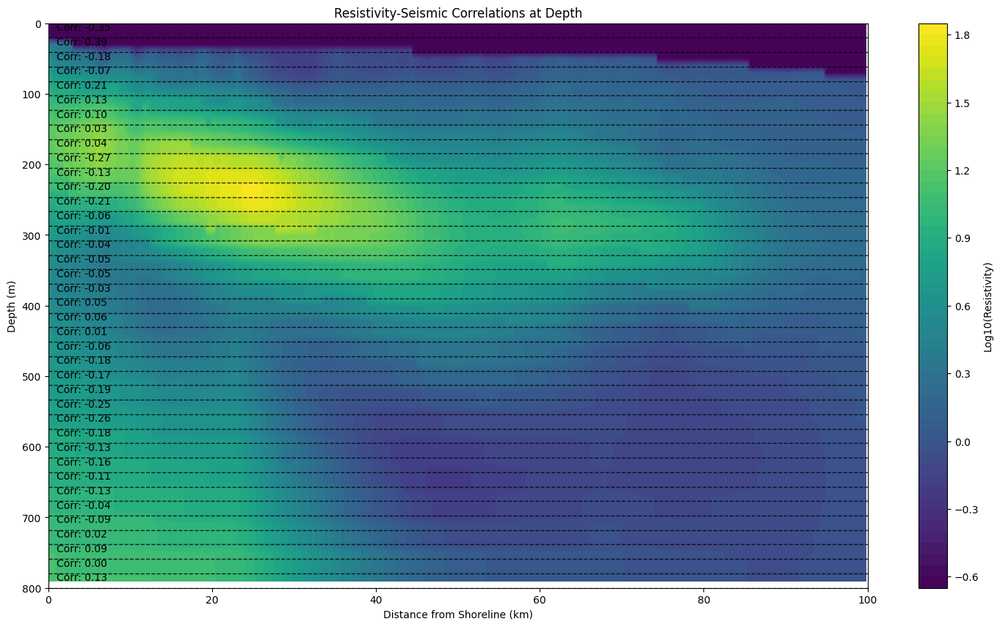

In [24]:
# Store segment correlations
segment_correlations = []

# Segment and calculate correlations by depth range
for i in range(len(depth_segments) - 1):
    segment_mask = (depths_clean >= depth_segments[i]) & (depths_clean < depth_segments[i+1])

    if segment_mask.any():
        segment_seismic = seismic_clean[segment_mask]
        segment_resistivity = resistivity_clean[segment_mask]

        if len(segment_seismic) > 1 and len(segment_resistivity) > 1:
            correlation = np.corrcoef(segment_seismic, segment_resistivity)[0, 1]
            segment_correlations.append(correlation)
        else:
            segment_correlations.append(np.nan)  # Not enough data points
    else:
        segment_correlations.append(np.nan)  # No valid data for this segment

# Heatmap with annotation for correlations
plt.figure(figsize=(18, 10))

# Plot the resistivity heatmap
plt.contourf(grid_distances_filtered, grid_depths_filtered, grid_resistivity_filtered, cmap='viridis', levels=50)
plt.colorbar(label='Log10(Resistivity)')

# Add dashed lines for each depth range
for i in range(len(depth_segments)):
    plt.axhline(depth_segments[i], color='black', linestyle='--', linewidth=1.0, alpha=0.8)

# Annotate the plot with segment correlations
for i, correlation in enumerate(segment_correlations):
    if not np.isnan(correlation):  # Skip annotations for NaN values
        mid_depth = (depth_segments[i] + depth_segments[i + 1]) / 2
        plt.text(
            distance_min + 1, mid_depth,
            f"Corr: {correlation:.2f}", color='black', fontsize=10
        )

# Set plot labels and formatting
plt.xlabel("Distance from Shoreline (km)")
plt.ylabel("Depth (m)")
plt.title("Resistivity-Seismic Correlations at Depth")
plt.gca().invert_yaxis()  # Depth increases downward
plt.show()

## Correlation Coefficents for depth and distance

In [12]:
# Reload seismic data for consistency
seismic_data_agc = seismicgather()
segy_path = "/content/drive/MyDrive/Senior Project/filtered_agc_seismic_data.sgy"
seismic_data_agc.read_segy_data(segy_path)

In [13]:
# Define depth and distance ranges
distance_min, distance_max = 0, 100  # km
depth_min, depth_max = 0, 800  # m
grid_size = 1000  # Resolution of the grid

# Create grids for distance and depth
grid_distances_filtered, grid_depths_filtered = np.meshgrid(
    np.linspace(distance_min, distance_max, grid_size),
    np.linspace(depth_min, depth_max, grid_size)
)

# Interpolate resistivity data to the grid
grid_resistivity_filtered = griddata(
    points=(processed_data['Distance_km'], processed_data['Depth']),
    values=processed_data['Log10_Rho'],
    xi=(grid_distances_filtered, grid_depths_filtered),
    method='linear'
)

# Verify grid shape
print(f"Resistivity Grid Shape: {grid_resistivity_filtered.shape}")


Resistivity Grid Shape: (1000, 1000)


In [14]:
# Calculate amplitude envelopes from seismic data
distances, depths, envelopes = seismic_data_agc.calculate_amplitude_envelope(
    distance_min, distance_max, depth_min, depth_max, trace_step=50, offset=0.0001
)

# Flatten distances and depths to match envelopes
depths_flat = np.hstack(depths)
envelopes_flat = np.hstack(envelopes)
distances_flat = np.repeat(distances, [len(d) for d in depths])

# Interpolate seismic envelopes to the grid
seismic_grid_envelopes = griddata(
    points=np.column_stack((distances_flat, depths_flat)),
    values=envelopes_flat,
    xi=(grid_distances_filtered, grid_depths_filtered),
    method='linear'
)

# Verify dimensions match
assert seismic_grid_envelopes.shape == grid_resistivity_filtered.shape, "Grid shapes do not match!"


In [15]:
# Define bins for depth and distance
depth_bins = np.linspace(depth_min, depth_max, num=60)  # 40 depth bins
distance_bins = np.linspace(distance_min, distance_max, num=60)  # 40 distance bins

# Initialize correlation map
correlation_map = np.full((len(depth_bins) - 1, len(distance_bins) - 1), np.nan)

# Loop through bins and calculate correlations
for i in range(len(depth_bins) - 1):
    for j in range(len(distance_bins) - 1):
        # Create mask for the current bin
        bin_mask = (
            (grid_depths_filtered >= depth_bins[i]) & (grid_depths_filtered < depth_bins[i + 1]) &
            (grid_distances_filtered >= distance_bins[j]) & (grid_distances_filtered < distance_bins[j + 1])
        )

        # Extract data within the bin
        seismic_bin = seismic_grid_envelopes[bin_mask]
        resistivity_bin = grid_resistivity_filtered[bin_mask]

        # Calculate correlation coefficient if enough data points exist
        if len(seismic_bin) > 1 and len(resistivity_bin) > 1:
            correlation_map[i, j] = np.corrcoef(seismic_bin, resistivity_bin)[0, 1]

# Verify map
print(f"Correlation Map Shape: {correlation_map.shape}")


Correlation Map Shape: (59, 59)


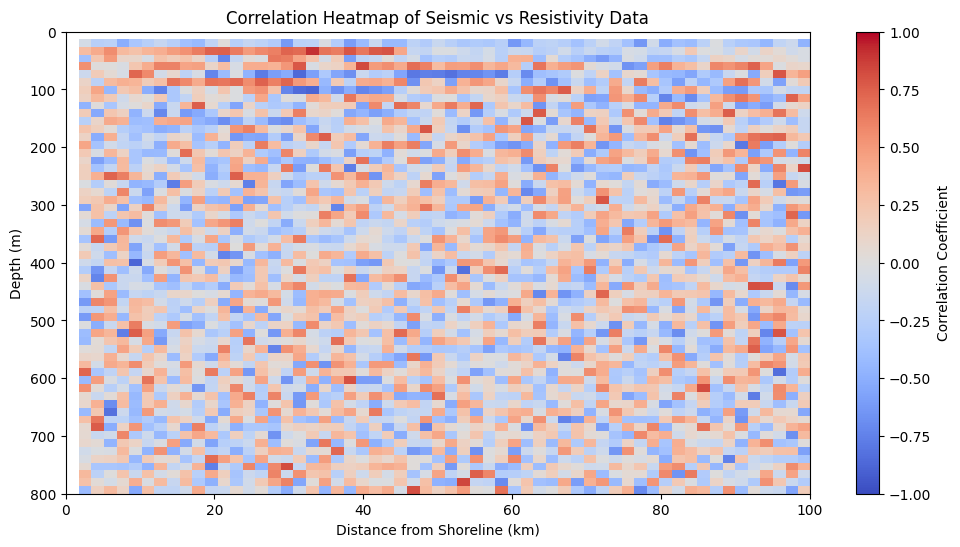

In [16]:
plt.figure(figsize=(12, 6))
plt.imshow(
    correlation_map,
    extent=[distance_min, distance_max, depth_max, depth_min],  # Flip depth axis
    cmap='coolwarm',
    vmin=-1, vmax=1,
    aspect='auto'
)
plt.colorbar(label="Correlation Coefficient")
plt.xlabel("Distance from Shoreline (km)")
plt.ylabel("Depth (m)")
plt.title("Correlation Heatmap of Seismic vs Resistivity Data")
plt.show()

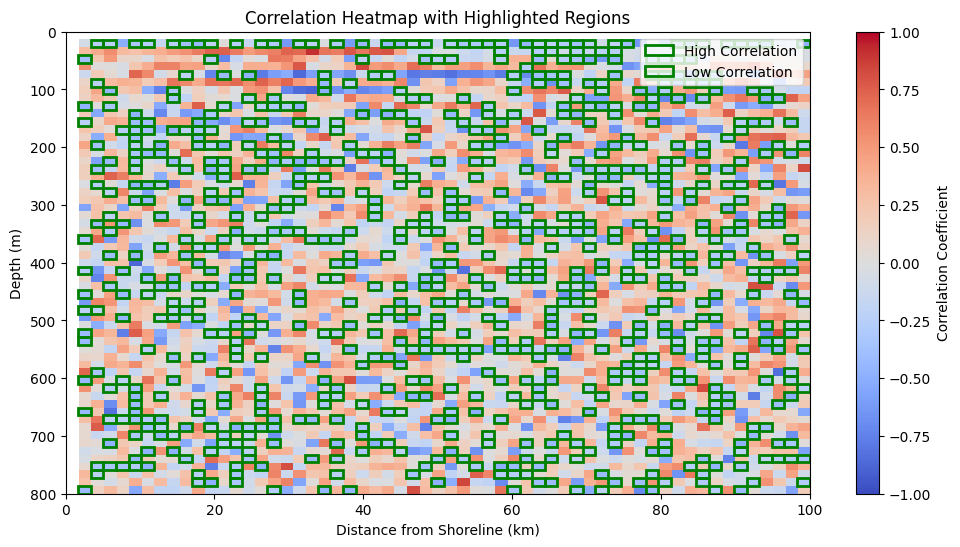

In [17]:
# Extract indices with matchin correlations
high_corr = np.argwhere((correlation_map > -0.5) & (correlation_map <= -0.2))

plt.figure(figsize=(12, 6))
# Plot correlation heatmap
plt.imshow(
    correlation_map,
    extent=[distance_min, distance_max, depth_max, depth_min],  # Flip depth axis
    cmap="coolwarm", vmin=-1, vmax=1, aspect='auto'
)
plt.colorbar(label="Correlation Coefficient")

# Overlay high correlation regions
for idx in high_corr:
    depth_range = (depth_bins[idx[0]], depth_bins[idx[0] + 1])
    distance_range = (distance_bins[idx[1]], distance_bins[idx[1] + 1])
    plt.gca().add_patch(plt.Rectangle(
        (distance_range[0], depth_range[0]),  # Lower-left corner
        distance_range[1] - distance_range[0],  # Width
        depth_range[1] - depth_range[0],  # Height
        edgecolor='green', facecolor='none', linewidth=2, label='High Correlation'
    ))

plt.xlabel("Distance from Shoreline (km)")
plt.ylabel("Depth (m)")
plt.title("Correlation Heatmap with Highlighted Regions")
plt.legend(["High Correlation", "Low Correlation"], loc='upper right')
plt.show()

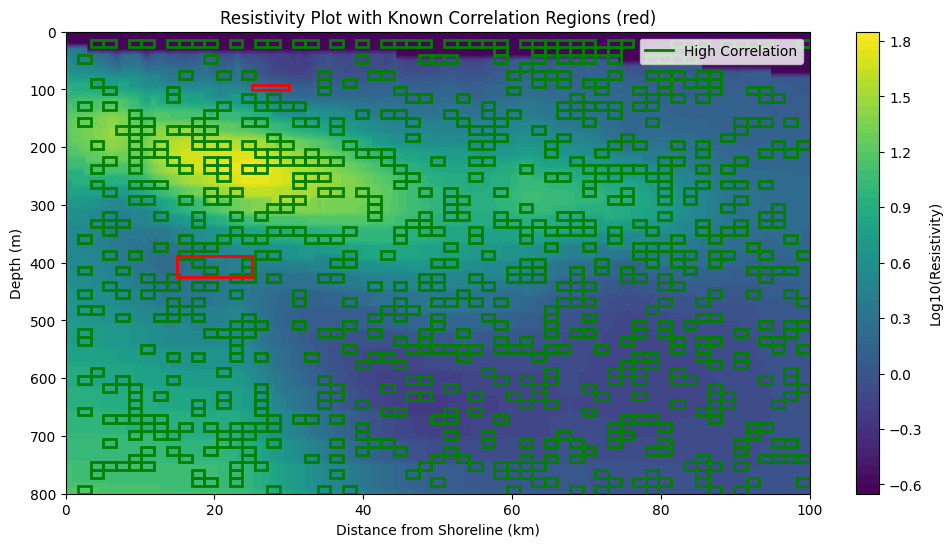

In [18]:
plt.figure(figsize=(12, 6))

# Plot the resistivity heatmap
plt.contourf(
    grid_distances_filtered,
    grid_depths_filtered,
    grid_resistivity_filtered,
    cmap="viridis",
    levels=50
)
plt.colorbar(label="Log10(Resistivity)")

# Highlight high correlation regions
for idx in high_corr:
    depth_range = (depth_bins[idx[0]], depth_bins[idx[0] + 1])
    distance_range = (distance_bins[idx[1]], distance_bins[idx[1] + 1])
    plt.gca().add_patch(plt.Rectangle(
        (distance_range[0], depth_range[0]),  # Lower-left corner
        distance_range[1] - distance_range[0],  # Width
        depth_range[1] - depth_range[0],  # Height
        edgecolor='green', facecolor='none', linewidth=2, label='High Correlation'
    ))

# Labels and titles
plt.xlabel("Distance from Shoreline (km)")
plt.ylabel("Depth (m)")
plt.title("Resistivity Plot with Known Correlation Regions (red)")
plt.gca().invert_yaxis()  # Depth increases downward

# Add a legend
handles = [
    plt.Line2D([0], [0], color="green", lw=2, label="High Correlation"),
]
plt.legend(handles=handles, loc='upper right')

# Manually specify known correlation regions
known_regions = [
    {'depth': (387.5, 425), 'distance': (15, 25)},
    {'depth': (92.5, 101.5), 'distance': (25, 30)},
]
# Overlay known regions
for region in known_regions:
    plt.gca().add_patch(plt.Rectangle(
        (region['distance'][0], region['depth'][0]),
        region['distance'][1] - region['distance'][0],
        region['depth'][1] - region['depth'][0],
        edgecolor='red', facecolor='none', linewidth=2, label='Known Correlation'
    ))


plt.show()

# Developing Code for Random Forest Analysis

Shape of frequencies: (11192,)
Shape of phases: (11192, 1000)
Shape of grid_depths_filtered: (1000, 1000)
Confusion Matrix:
[[199776    122]
 [   102      0]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    199898
           1       0.00      0.00      0.00       102

    accuracy                           1.00    200000
   macro avg       0.50      0.50      0.50    200000
weighted avg       1.00      1.00      1.00    200000



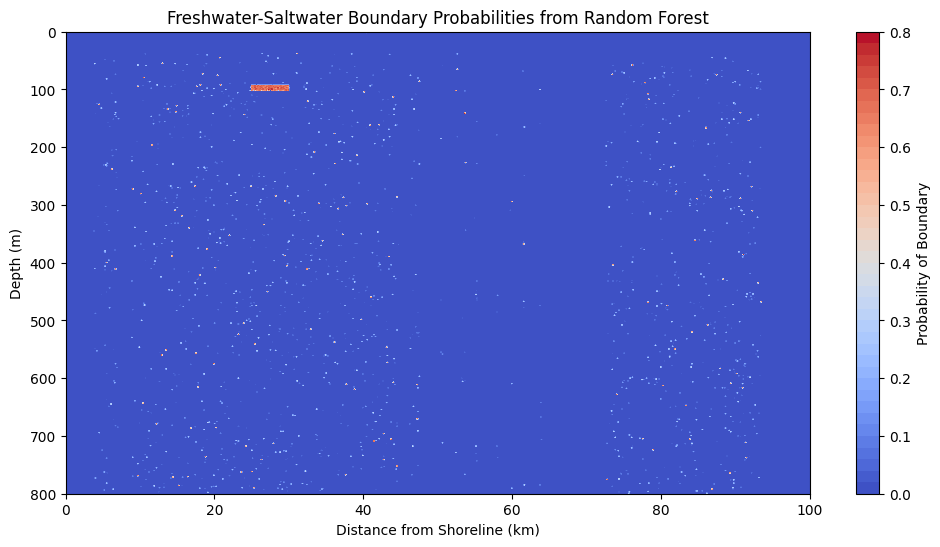

In [22]:
# Flatten amplitude envelopes
seismic_amplitude_flat = seismic_grid_envelopes.flatten()

# Extract frequency and phase features
sampling_rate = 2000  # Determined sampling rate
frequencies, phases = seismic_data_agc.extract_frequency_phase_features(sampling_rate)

print(f"Shape of frequencies: {frequencies.shape}")
print(f"Shape of grid_depths_filtered: {grid_depths_filtered.shape}")

# Generate indices for interpolation
# Use a linear index for distances
distance_indices = np.linspace(0, grid_distances_filtered.shape[1] - 1, frequencies.shape[0])

# Interpolate `frequencies` to match the grid
frequencies_interpolated = np.interp(
    np.arange(grid_distances_filtered.shape[1]),  # Target indices
    np.arange(len(frequencies)),  # Source indices
    frequencies  # Source values
)

# Expand `frequencies_interpolated` across the depth axis
frequencies_grid = np.tile(frequencies_interpolated, (grid_depths_filtered.shape[0], 1))

# Flatten the interpolated frequencies to match the amplitude
seismic_frequency_flat = frequencies_grid.flatten()

# Ensure amplitude and frequency match in shape
if seismic_amplitude_flat.shape != seismic_frequency_flat.shape:
    min_length = min(len(seismic_amplitude_flat), len(seismic_frequency_flat))
    seismic_amplitude_flat = seismic_amplitude_flat[:min_length]
    seismic_frequency_flat = seismic_frequency_flat[:min_length]

# Stack features for the model
X = np.column_stack((seismic_amplitude_flat, seismic_frequency_flat))

# Labels (boundary or non-boundary)
boundary_labels_flat = np.zeros_like(seismic_amplitude_flat, dtype=int)

# Freshwater_Saltwater Boundary
known_boundaries = [
    {'depth_range': (92.5, 101.5), 'distance_range': (25, 30)},
]

# Convert known boundaries into labels
for boundary in known_boundaries:
    depth_mask = (grid_depths_filtered.flatten() >= boundary['depth_range'][0]) & \
                 (grid_depths_filtered.flatten() <= boundary['depth_range'][1])
    distance_mask = (grid_distances_filtered.flatten() >= boundary['distance_range'][0]) & \
                    (grid_distances_filtered.flatten() <= boundary['distance_range'][1])
    boundary_labels_flat[depth_mask & distance_mask] = 1

# Train-test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, boundary_labels_flat, test_size=0.2, random_state=42)

# Train the model
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf_model.fit(X_train, y_train)

# Evaluate the model
from sklearn.metrics import classification_report, confusion_matrix
y_pred = rf_model.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Predict on the full dataset
boundary_probabilities = rf_model.predict_proba(X)[:, 1]
boundary_probabilities_grid = boundary_probabilities.reshape(grid_depths_filtered.shape)

# Plot boundary probabilities
plt.figure(figsize=(12, 6))
plt.contourf(grid_distances_filtered, grid_depths_filtered, boundary_probabilities_grid, cmap="coolwarm", levels=50)
plt.colorbar(label="Probability of Boundary")
plt.xlabel("Distance from Shoreline (km)")
plt.ylabel("Depth (m)")
plt.title("Freshwater-Saltwater Boundary Probabilities from Random Forest")
plt.gca().invert_yaxis()
plt.show()

Confusion Matrix:
[[197916   1100]
 [   972     12]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    199016
           1       0.01      0.01      0.01       984

    accuracy                           0.99    200000
   macro avg       0.50      0.50      0.50    200000
weighted avg       0.99      0.99      0.99    200000



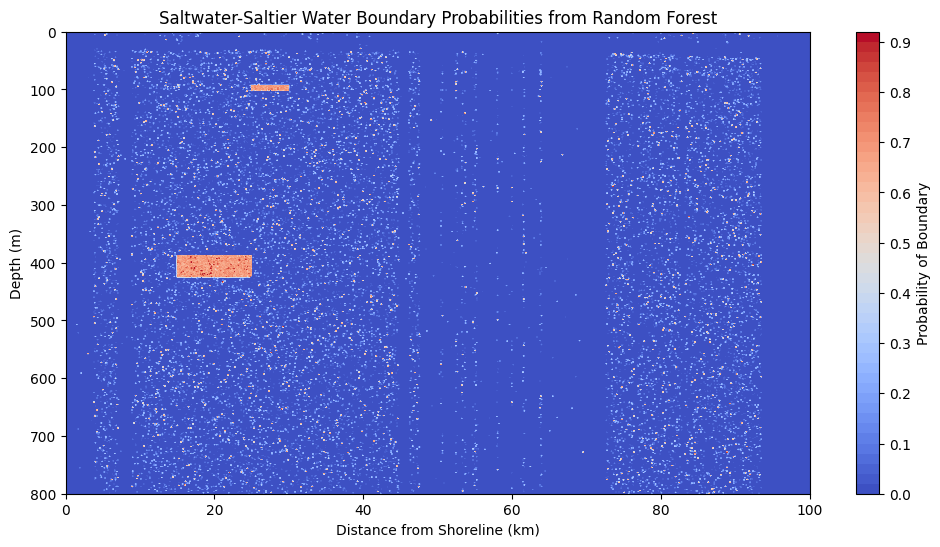

In [23]:
# Adding Saltwater-Saltier Water Boundaries
known_boundaries = [
    {'depth_range': (387.5, 425), 'distance_range': (15, 25)},
]

# Convert known boundaries into labels
for boundary in known_boundaries:
    depth_mask = (grid_depths_filtered.flatten() >= boundary['depth_range'][0]) & \
                 (grid_depths_filtered.flatten() <= boundary['depth_range'][1])
    distance_mask = (grid_distances_filtered.flatten() >= boundary['distance_range'][0]) & \
                    (grid_distances_filtered.flatten() <= boundary['distance_range'][1])
    boundary_labels_flat[depth_mask & distance_mask] = 1

# Train-test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, boundary_labels_flat, test_size=0.2, random_state=42)

# Train the model
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf_model.fit(X_train, y_train)

# Evaluate the model
from sklearn.metrics import classification_report, confusion_matrix
y_pred = rf_model.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Predict on the full dataset
boundary_probabilities = rf_model.predict_proba(X)[:, 1]
boundary_probabilities_grid = boundary_probabilities.reshape(grid_depths_filtered.shape)

# Plot boundary probabilities
plt.figure(figsize=(12, 6))
plt.contourf(grid_distances_filtered, grid_depths_filtered, boundary_probabilities_grid, cmap="coolwarm", levels=50)
plt.colorbar(label="Probability of Boundary")
plt.xlabel("Distance from Shoreline (km)")
plt.ylabel("Depth (m)")
plt.title("Saltwater-Saltier Water Boundary Probabilities from Random Forest")
plt.gca().invert_yaxis()
plt.show()

## Plot using both windows as labels, process can be repeated upon the identification of more windows for future training.

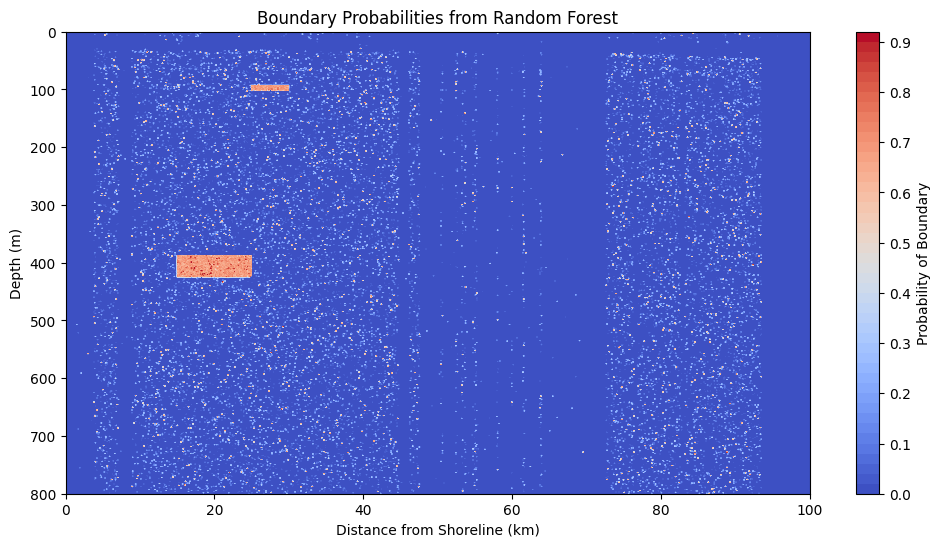

In [24]:
# Plot boundary probabilities
plt.figure(figsize=(12, 6))
plt.contourf(grid_distances_filtered, grid_depths_filtered, boundary_probabilities_grid, cmap="coolwarm", levels=50)
plt.colorbar(label="Probability of Boundary")
plt.xlabel("Distance from Shoreline (km)")
plt.ylabel("Depth (m)")
plt.title("Boundary Probabilities from Random Forest")
plt.gca().invert_yaxis()
plt.show()